In [7]:
from Library import *
from Data_Preparation import *
#from Data_Preparation2 import *
from pprint import pprint
import folium 
import time
import scipy
import sklearn
from IPython.display import display
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
from itertools import combinations
import pickle
from sklearn import decomposition
from icecream import ic 
import os
from tqdm import tqdm
import requests
import nbimporter
from datetime import datetime
from sklearn.mixture import GaussianMixture
from sklearn.metrics import roc_curve, auc , roc_auc_score, r2_score, accuracy_score , silhouette_score
from sklearn.model_selection import GridSearchCV
from catboost import CatBoostClassifier
from sklearn.neural_network import MLPClassifier
import reverse_geocoder as rg
from datetime import datetime, time
import random
import shutil
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.cluster import DBSCAN
from IPython.display import Markdown, display
import geopandas as gpd
from translate import translator
from shapely.geometry import Point
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
def printmd(string, color=None):
    colorstr = "<span style='color:{}'>{}</span>".format(color, string)
    display(Markdown(colorstr))

In [8]:
def speed_estimation(trip_record):
    """
    Estimate the speed with the GPS points and calculate some statistical measures of the estimation.
    :param trip_record: data frame with the original GPS meta-data
    :return: trip_record data frame with new columns - prev_time, prev_latitude, prev_longitude
    """
    trip_record['prev_time'] = trip_record['orig_time'].shift(1)
    trip_record['prev_latitude'] = trip_record['latitude'].shift(1)
    trip_record['prev_longitude'] = trip_record['longitude'].shift(1)
    trip_record['speed'] = trip_record.apply(lambda row: haversine(row['prev_longitude'], row['prev_latitude'],
                                                                       row['longitude'], row['latitude']) /
                                                             ((row['orig_time']-row['prev_time']).seconds/(60*60)),
                                                 axis=1)
#     pearson_corr, p_value = pearsonr(trip_record['speed_est'].iloc[1:], trip_record['speed'].iloc[1:])
#     plt.plot(trip_record['orig_time'], trip_record['speed_est'])
#     plt.plot(trip_record['orig_time'], trip_record['speed'])
#     plt.show()
    return trip_record


def acceleration_estimation(trip_record):
    """
    Estimate the acceleration with the speed data.
    :param trip_record: data frame with the original GPS meta-data
    :return: trip_record data frame with new columns - prev_time, next_time, prev_speed, next_speed,
                acceleration_est_1/2/3
    """
    trip_record['prev_time'] = trip_record['orig_time'].shift(1)
    trip_record['next_time'] = trip_record['orig_time'].shift(-1)
    trip_record['prev_speed'] = trip_record['speed'].shift(1)
    trip_record['next_speed'] = trip_record['speed'].shift(-1)
    trip_record = trip_record.copy().loc[~(trip_record['next_time'] == trip_record['prev_time'])]
    trip_record['acceleration_est_1'] = trip_record.apply(lambda row: (row['next_speed'] - row['prev_speed']) /
                                                                      (row['next_time'] - row['prev_time']).seconds
                                                          , axis=1)
    trip_record.at[trip_record.index[0], 'acceleration_est_1'] = (trip_record['next_speed'].iloc[0] -
                                                                  trip_record['speed'].iloc[0]) / \
                                                                 (trip_record['next_time'].iloc[0] -
                                                                  trip_record['orig_time'].iloc[0]).seconds
    trip_record.at[trip_record.index[-1], 'acceleration_est_1'] = (trip_record['speed'].iloc[-1] -
                                                                   trip_record['prev_speed'].iloc[-1]) / \
                                                                  (trip_record['orig_time'].iloc[-1]
                                                                   - trip_record['prev_time'].iloc[-1]).seconds
    """trip_record['acceleration_est_2'] = trip_record.apply(lambda row: (row['speed'] - row['prev_speed']) /
                                                                      (row['orig_time'] - row['prev_time']).seconds,
                                                          axis=1)
    trip_record['acceleration_est_3'] = trip_record.apply(lambda row: (row['next_speed'] - row['speed']) /
                                                                      (row['next_time'] - row['orig_time']).seconds
                                                          , axis=1)"""
    return trip_record


def angular_acc_estimation(trip_record):
    """
    create the angular acc estimation
    :param trip_record: data frame having the shifted columns from the acceleration estimation function.
    :return: 3 new columns to the trip data frame - prev direction, next direction, and angular acc.
    """
    # trip_no_idle = trip_record.copy()
    trip_record = trip_record.copy().loc[~((trip_record['orig_time'] == trip_record['prev_time']) |
                                           (trip_record['orig_time'] == trip_record['next_time']))]
    trip_record['prev_direction'] = trip_record.direction.shift(1)
    trip_record['next_direction'] = trip_record.direction.shift(-1)
    # trip_record['prev_time'] = trip_record.orig_time.shift(1)
    # trip_record['next_time'] = trip_record.orig_time.shift(-1)
    trip_record = trip_record.copy().loc[~(trip_record['next_time'] == trip_record['prev_time'])]
    trip_record['angular_acc'] = trip_record.apply(lambda row:
                                                   (row['next_direction'] - 2 * row['direction'] + row['prev_direction']) /
                                                   ((row['next_time'] - row['orig_time']).seconds * (row['orig_time'] - row['prev_time']).seconds), axis=1)
    return trip_record

In [9]:
def get_all_file_paths(directory):
    file_paths = []
    for root, _, files in os.walk(directory):
        for file in files:
            if not file.endswith(".pkl"):
                file_paths.append(os.path.join(root, file))
    return file_paths



In [10]:
def get_pickle_files(directory_path):
    pickle_files = []
    seen_files = set()  # To keep track of files already processed

    for filename in os.listdir(directory_path):
        if filename.endswith(".pickle"):
            pickle_file_path = os.path.join(directory_path, filename)

            # Check if the file has already been processed
            if pickle_file_path in seen_files:
                continue

            seen_files.add(pickle_file_path)
            
            with open(pickle_file_path, 'rb') as file:
                data = pickle.load(file)
                # Process the data as needed
                # For example, you can append it to a list or perform other operations
                pickle_files.append(data)

    return pickle_files


def upload_coor_data(df):
    lon = round(df.iloc[0]['longitude'],5)
    lat = round(df.iloc[0]['latitude'],5)
    try:
        directory_path = f"/bigdata/users-home/dor/transpotation research/agg_data/coors_data_ts_new/{round(lon*10,0)}/start"
        
        pickle_files_list = get_pickle_files(directory_path)
        return pickle_files_list
    except FileNotFoundError:
        print('no dir for',lon,lat)
    

def upload_all_coor_data():
    directory_path = f"/bigdata/users-home/dor/transpotation research/agg_data/coors_data_ts_new/"
    directory_paths = get_all_file_paths(directory_path)
    for dir1 in directory_paths:
        curr_paths = get_all_file_paths(os.path.join(dir1, 'start'))
        for dir2 in curr_path:
            pickle_files_list += get_pickle_files(dir2)
    return pickle_files_list

In [11]:
def trip_on_map(df):
    # Create a map object
    m = folium.Map(location=[0, 0], zoom_start=2)

    # Define colors for markers
    colors = {2: 'green', 0: 'blue', 1: 'red', 3: 'orange', 4: 'pink', 5: 'teal', 6: 'maroon', 7: 'lavender'}

    color = colors[0]
    j = 0 


    for i, row in df.iterrows():
        if row['speed'] == 0:
            color = colors[1]
            rad = 8
        else:
            color = colors[0]
            rad = 5
        lat, lon = row['latitude'], row['longitude']
        folium.CircleMarker(location=[lat, lon], radius=rad, color=color, fill=True, fill_color=color).add_to(m)

    # Display the map
    return m

In [12]:
pd.options.mode.chained_assignment = None
import warnings
warnings.filterwarnings('ignore')

In [13]:

def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance in kilometers between two points 
    on the earth (specified in decimal degrees)
    """
    # Convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])

    # Haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a)) 
    r = 6371  # Radius of earth in kilometers. Use 3956 for miles. Determines return value units.
    return c * r

def calculate_speed(df):
    """
    Calculate the speed based on latitude and longitude coordinates.
    
    Parameters:
    df (pd.DataFrame): DataFrame with 'timestamp', 'latitude', and 'longitude' columns.
    
    Returns:
    pd.DataFrame: DataFrame with an additional 'speed' column in km/h.
    """
    # Ensure the timestamp column is in datetime format
    df['timestamp'] = pd.to_datetime(df['orig_time'])
    
    # Calculate distance using the haversine formula
    df['distance_km'] = haversine(df['longitude'], df['latitude'], 
                                  df['longitude'].shift(), df['latitude'].shift())
    
    # Calculate time difference in hours
    df['time_diff_h'] = (df['timestamp'] - df['timestamp'].shift()).dt.total_seconds() / 3600
    
    # Calculate speed in km/h
    df['speed'] = df['distance_km'] / df['time_diff_h']
    
    # Remove the first row since it will have NaN values for distance and speed
    df = df.dropna(subset=['distance_km', 'time_diff_h', 'speed'])
    
    # Drop helper columns if not needed
    df.drop(columns=['distance_km', 'time_diff_h'], inplace = True)
    
    return df

In [14]:
all_trips = []
for year in ['2018','2019']:
        for month in range(1,13,1): 

            with open(f"/bigdata/users-home/dor/transpotation research/agg_data/preprocessGlobalFeatures/{str(month)}_{year}_[460631]_trips.pickle", 'rb') as handle:
                    trips_lst = pickle.load(handle)
            for trip in trips_lst[0]:
                
                trip.time_series_record.drop_duplicates(subset=['orig_time'], keep=False)
#                 curr_trip = speed_estimation(trip.time_series_record)
                curr_trip = acceleration_estimation(trip.time_series_record)
                curr_trip =angular_acc_estimation(curr_trip)
                curr_trip = curr_trip[(curr_trip['vehicle_state'] == 1) | (curr_trip['vehicle_state'] == 2)]
                curr_trip['date'] = curr_trip['orig_time'].dt.date
                curr_trip['hour'] = curr_trip['orig_time'].dt.time
                curr_trip['drive_id'] = trip.id
                
                curr_trip.drop(['prev_time',
                       'next_time','prev_speed','next_speed','prev_direction',
                      'next_direction','mileage','vehicle_id'],axis=1,inplace=True)
                curr_trip.fillna(0, inplace=True)
                all_trips.append(curr_trip)
print(len(all_trips))

2711


the amount of filtered drives: 2220
71


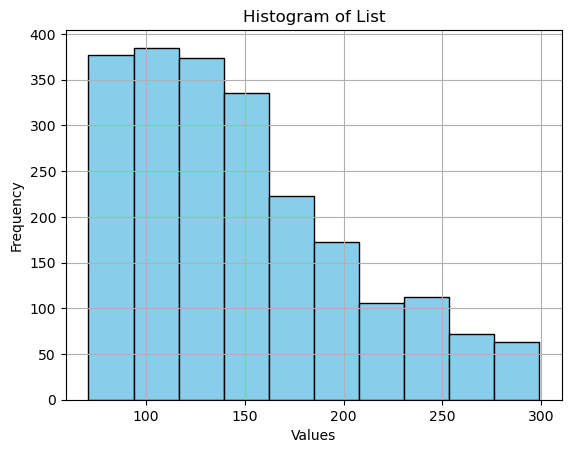

In [15]:
import matplotlib.pyplot as plt
min_df = 0
minimum = 180
lengths = []
filtered_trips = [series for series in all_trips if (len(series) > 70 and len(series) < 300)  and (np.max(series.speed)>0 or np.max(series.vehicle_state)<2)]
print('the amount of filtered drives:',len(filtered_trips))
for series in filtered_trips:
    len_cur = len(series)
    lengths.append(len_cur)
    if len_cur < minimum:
        minimum = len_cur
        min_df = series
print(minimum)
plt.hist(lengths, bins=10, color='skyblue', edgecolor='black')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Histogram of List')
plt.grid(True)
plt.show()

In [16]:
file_path = "/bigdata/users-home/dor/transpotation research/agg_data/grouped_drives.pickle"

# Read the pickle file
with open(file_path, 'rb') as handle:
    dict_drives = pickle.load(handle)

# Now you can use the dictionary stored in dict_drives
# For example, print the keys of the dictionary
print(dict_drives.keys())

dict_keys([1, 2, 3, 5, 6, 4])


In [17]:
drives_lst = [list(dict_drives[group].index) for group in dict_drives]

In [18]:
ts_drives = []
for trip in filtered_trips:
    for ind in drives_lst:
        if np.mean(trip.drive_id) in ind:
#             new_index = pd.date_range(start, end, freq='0.5min')
            trip['speed'] = round(trip['speed'],0)
            ts_drives.append(trip)
print(len(ts_drives))

754


In [19]:
groups_ts = {}

for group in dict_drives:
    for ind , row in dict_drives[group].iterrows():
        for series in ts_drives:
            if np.mean(series.drive_id) == ind:
                groups_ts[group] = groups_ts.get(group , [])
                groups_ts[group].append(series)
                break


In [20]:

def split_dataframe(df):
    lst = []
    df_indices = []
    for i, row in df.iterrows():
        try:
            if row.speed ==0 and df.loc[i + 1].speed > 0:
                lst.append(df_indices)
                df_indices = []
        except KeyError:
            pass
        df_indices.append(i)
    lst.append(df_indices)  # Append the last set of indices

    dataframes = [df[df.index.isin(indices)] for indices in lst if indices]  # Exclude empty lists

    return dataframes

In [21]:
splitted_ts_drives = []
for trip in ts_drives:
    sub_trips_lst = split_dataframe(trip)
    for sub_trip in sub_trips_lst:
        splitted_ts_drives.append(sub_trip)


In [22]:
import numpy as np
start_coor = set()

new_splitted_ts_drives = []
for series in splitted_ts_drives:
    if np.max(series.speed) != 0:
        series = series.drop_duplicates(subset=['longitude', 'latitude'])
        new_splitted_ts_drives.append(series)
        
splitted_ts_drives = new_splitted_ts_drives

In [23]:
splitted_ts_drives

[   longitude   latitude           orig_time  speed  direction  vehicle_state  \
 6  34.857776  32.165505 2018-01-05 06:02:11      0          0              2   
 7  34.857786  32.165485 2018-01-05 06:02:19      3        164              1   
 
    road_speed  acceleration_est_1  angular_acc        date      hour  \
 6        50.0                 0.3        10.25  2018-01-05  06:02:11   
 7        50.0                 0.0        -4.10  2018-01-05  06:02:19   
 
       drive_id  
 6  12808103918  
 7  12808103918  ,
     longitude   latitude           orig_time  speed  direction  vehicle_state  \
 8   34.857791  32.165418 2018-01-05 06:02:29      0          0              2   
 9   34.857665  32.165378 2018-01-05 06:02:39      6        255              1   
 10  34.857411  32.165298 2018-01-05 06:02:49     11        249              1   
 11  34.857151  32.165133 2018-01-05 06:02:59     12        186              1   
 12  34.857251  32.164813 2018-01-05 06:03:09      9        168      

1


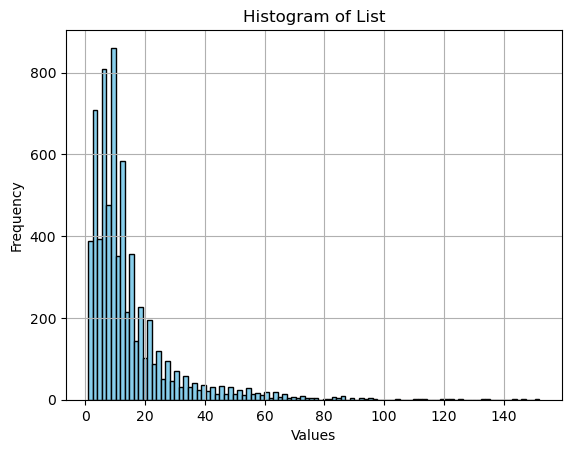

In [24]:
minimum =1000
min_df = 0
lengths =[]
for series in splitted_ts_drives:
    len_cur = len(series)
    lengths.append(len_cur)
    if len_cur < minimum:
        minimum = len_cur
        min_df = series
print(minimum)
plt.hist(lengths, bins=100, color='skyblue', edgecolor='black')
plt.xlabel('Values')
plt.ylabel('Frequency')
plt.title('Histogram of List')
plt.grid(True)
plt.show()

In [25]:
leng_dict = {}
for i in lengths:
    leng_dict[i] = leng_dict.get(i,0) + 1
pprint(leng_dict)

{1: 67,
 2: 322,
 3: 366,
 4: 343,
 5: 394,
 6: 379,
 7: 431,
 8: 476,
 9: 441,
 10: 420,
 11: 351,
 12: 305,
 13: 279,
 14: 214,
 15: 166,
 16: 191,
 17: 144,
 18: 125,
 19: 101,
 20: 101,
 21: 107,
 22: 89,
 23: 88,
 24: 58,
 25: 62,
 26: 50,
 27: 51,
 28: 43,
 29: 47,
 30: 36,
 31: 35,
 32: 32,
 33: 29,
 34: 30,
 35: 31,
 36: 19,
 37: 23,
 38: 25,
 39: 18,
 40: 19,
 41: 21,
 42: 16,
 43: 14,
 44: 15,
 45: 21,
 46: 12,
 47: 14,
 48: 23,
 49: 9,
 50: 13,
 51: 11,
 52: 12,
 53: 11,
 54: 14,
 55: 15,
 56: 15,
 57: 10,
 58: 6,
 59: 11,
 60: 12,
 61: 8,
 62: 5,
 63: 9,
 64: 9,
 65: 6,
 66: 8,
 67: 5,
 68: 5,
 69: 1,
 70: 6,
 71: 5,
 72: 4,
 73: 4,
 74: 5,
 75: 3,
 76: 1,
 77: 4,
 78: 1,
 80: 1,
 81: 1,
 82: 1,
 83: 3,
 84: 3,
 85: 3,
 86: 3,
 87: 5,
 89: 2,
 90: 1,
 93: 3,
 94: 2,
 95: 2,
 96: 1,
 97: 1,
 104: 1,
 110: 1,
 112: 1,
 113: 1,
 114: 1,
 119: 1,
 121: 1,
 123: 1,
 125: 1,
 133: 1,
 134: 2,
 143: 1,
 146: 1,
 152: 1}


In [26]:
import numpy as np
from sklearn.cluster import DBSCAN
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean

def fastdtw_distance(ts1, ts2):
    distance, _ = fastdtw(ts1, ts2, dist=euclidean)
    return distance



In [27]:
ff=groups_ts[1][1]

In [28]:
group_ts_for_dbscan = {}
for group in groups_ts:
    group_ts_for_dbscan[group] = group_ts_for_dbscan.get(group , [])
    for series in groups_ts[group]:
#         series['hour'] = series['orig_time'].dt.hour
        # Identify changes in latitude and longitude
        series['lat_change'] = series['latitude'].shift() != series['latitude']
        series['lon_change'] = series['longitude'].shift() != series['longitude']

        # Combine the change indicators
        series['change'] = series['lat_change'] | series['lon_change']

        # Shift the change indicator to mark the last unchanged row
        series['keep'] = series['change'].shift(-1, fill_value=True)

        # Keep only the rows marked for keeping
        series = series[series['keep']]
        
        # Drop the helper columns
        series.drop(columns=['lat_change', 'lon_change', 'change', 'keep'],inplace = True)
#         calculate_speed(series)
        acceleration_estimation(series)
        angular_acc_estimation(series)
#         series["lon_lat"] = str(series['latitude'][-4:-1])+str(series['longitude'][-4:-1])
#         series.apply(lambda row: (round(row["latitude"], 5),
#                                     round(row["longitude"], 5)), axis=1)
        series.drop(columns=['vehicle_state', 'date','direction','prev_time','next_time','prev_speed','next_speed'],inplace = True)
        series.dropna(inplace=True)
#         series.reset_index(inplace=True,drop=True)
        group_ts_for_dbscan[group].append(series)

In [29]:
splitted_ts_groups ={}
for group in group_ts_for_dbscan:
    for curr_df in group_ts_for_dbscan[group]:
        splitted_ts_groups[group] = splitted_ts_groups.get(group , [])
        splitted_ts_groups[group] = splitted_ts_groups[group] + split_dataframe(curr_df)


In [30]:
drives_hours = {1:[7,8,9,10,19,20,21,22,23],2:[11,12,13,14,15,16,17,18],3:[0,1,2,3,4,5,6]}

In [31]:
scaling_parameters = {}
for group in splitted_ts_groups:
    for series in splitted_ts_groups[group]:
        series['group'] = group
        length = len(series)
        if 5 < len(series) < 40:
            road_speed = series.iloc[0]['road_speed']
            for h in drives_hours:
                if int(series.iloc[0]['hour'].hour) in drives_hours[h]:
                    group_hour = h
                
            scaling_parameters[(length, road_speed, group_hour)] = scaling_parameters.get((length, road_speed, group_hour),[])
            scaling_parameters[(length, road_speed, group_hour)].append(series)

In [32]:
for key in scaling_parameters:
    print(key,len(scaling_parameters[key]))

(6, 50.0, 3) 103
(14, 50.0, 3) 54
(22, 50.0, 3) 25
(8, 50.0, 3) 92
(15, 50.0, 3) 41
(7, 60.0, 3) 7
(11, 50.0, 3) 80
(7, 50.0, 3) 119
(27, 50.0, 3) 17
(29, 60.0, 3) 1
(16, 50.0, 3) 49
(10, 50.0, 3) 116
(6, 50.0, 2) 178
(13, 50.0, 2) 115
(7, 0.0, 2) 8
(9, 50.0, 2) 122
(31, 50.0, 3) 14
(17, 50.0, 3) 28
(9, 50.0, 3) 98
(14, 50.0, 1) 65
(31, 50.0, 2) 12
(9, 70.0, 2) 20
(20, 70.0, 2) 2
(16, 50.0, 2) 73
(12, 50.0, 1) 99
(20, 50.0, 1) 42
(9, 50.0, 1) 149
(21, 50.0, 1) 42
(10, 50.0, 1) 127
(11, 70.0, 1) 3
(7, 50.0, 1) 134
(11, 50.0, 1) 96
(18, 50.0, 1) 46
(31, 50.0, 1) 5
(9, 60.0, 1) 6
(10, 50.0, 2) 145
(8, 50.0, 2) 166
(12, 50.0, 2) 116
(30, 50.0, 2) 14
(15, 50.0, 2) 63
(20, 50.0, 2) 31
(19, 50.0, 1) 39
(8, 50.0, 1) 145
(15, 50.0, 1) 61
(32, 60.0, 1) 1
(17, 50.0, 1) 43
(26, 50.0, 1) 17
(17, 50.0, 2) 60
(26, 50.0, 3) 8
(13, 50.0, 1) 105
(16, 50.0, 1) 56
(35, 50.0, 1) 9
(6, 50.0, 1) 124
(14, 50.0, 2) 86
(33, 60.0, 2) 3
(11, 50.0, 2) 133
(27, 50.0, 2) 18
(19, 50.0, 2) 31
(7, 50.0, 2) 145
(29, 50.

In [33]:
new_dict = {key: scaling_parameters[key]  for key in scaling_parameters if len(scaling_parameters[key])>30}

In [34]:
l = 0
for key in new_dict:
    print(key,len(new_dict[key]))
    l+=len(new_dict[key])

(6, 50.0, 3) 103
(14, 50.0, 3) 54
(8, 50.0, 3) 92
(15, 50.0, 3) 41
(11, 50.0, 3) 80
(7, 50.0, 3) 119
(16, 50.0, 3) 49
(10, 50.0, 3) 116
(6, 50.0, 2) 178
(13, 50.0, 2) 115
(9, 50.0, 2) 122
(9, 50.0, 3) 98
(14, 50.0, 1) 65
(16, 50.0, 2) 73
(12, 50.0, 1) 99
(20, 50.0, 1) 42
(9, 50.0, 1) 149
(21, 50.0, 1) 42
(10, 50.0, 1) 127
(7, 50.0, 1) 134
(11, 50.0, 1) 96
(18, 50.0, 1) 46
(10, 50.0, 2) 145
(8, 50.0, 2) 166
(12, 50.0, 2) 116
(15, 50.0, 2) 63
(20, 50.0, 2) 31
(19, 50.0, 1) 39
(8, 50.0, 1) 145
(15, 50.0, 1) 61
(17, 50.0, 1) 43
(17, 50.0, 2) 60
(13, 50.0, 1) 105
(16, 50.0, 1) 56
(6, 50.0, 1) 124
(14, 50.0, 2) 86
(11, 50.0, 2) 133
(19, 50.0, 2) 31
(7, 50.0, 2) 145
(21, 50.0, 2) 32
(8, 70.0, 2) 34
(22, 50.0, 2) 31
(13, 50.0, 3) 50
(12, 50.0, 3) 70
(18, 50.0, 2) 58


In [133]:
dict_length = {}
for group in groups_ts:
    for se in groups_ts[group]:
        curr_len = len(se)
        se['group'] = group
        dict_length[curr_len] = dict_length.get(curr_len,[])
        dict_length[curr_len].append(se)

In [136]:
for key in dict_length:
    print(key , len(dict_length[key]))

135 8
127 7
108 9
253 2
81 9
140 7
105 10
141 5
261 1
159 3
170 5
103 7
240 2
134 10
286 2
130 5
147 8
106 8
101 7
222 2
236 2
80 11
162 8
154 5
157 2
174 8
113 6
281 3
89 7
175 5
133 10
122 1
245 3
92 8
263 2
96 8
164 6
187 2
146 6
217 2
83 5
137 2
139 6
116 7
248 1
78 10
210 1
110 8
166 2
138 3
234 3
152 12
229 3
150 9
189 3
176 5
119 5
232 3
278 2
128 10
287 1
98 7
144 6
158 2
215 2
99 9
156 3
177 3
165 4
79 4
272 3
111 8
132 9
160 4
149 5
292 3
107 9
129 5
102 5
167 7
195 2
169 5
151 5
178 3
143 8
171 3
112 8
136 10
142 3
145 3
88 4
153 5
185 1
117 8
188 4
194 5
155 3
265 3
207 2
75 4
161 4
246 2
252 2
191 1
198 1
264 1
196 2
182 2
181 4
230 1
237 3
220 2
118 6
179 2
163 4
228 1
168 5
231 2
190 2
124 9
212 1
74 8
94 3
93 4
148 2
173 1
180 4
121 5
85 5
238 1
125 4
86 3
206 2
258 4
126 6
197 4
100 4
95 4
84 9
71 7
233 1
131 6
104 2
239 2
109 2
270 1
183 4
184 1
123 4
192 2
115 2
76 3
211 1
72 7
241 2
97 4
274 1
214 2
282 1
288 1
201 1
120 5
114 5
242 1
203 2
227 1
87 8
82 3
269 2
73 

In [142]:
import pandas as pd
import numpy as np
from sktime.transformations.panel.rocket import MiniRocketMultivariate

# Define the convert_dfs_to_arrays function
def convert_dfs_to_arrays(df_list):
    arrays = []
    labels = []
    for df in df_list:
        arrays.append(df[['speed', 'acceleration_est_1', 'angular_acc']].values.T)  # Transpose to get shape (num_features, num_timesteps)
        labels.append(df.iloc[0]['group'])
    return np.stack(arrays, axis=0), labels

t_labels = []
X_transformed_list = []  # List to store all transformed arrays

for key in dict_length:
    arrays, true_labels = convert_dfs_to_arrays(dict_length[key])
    t_labels += true_labels
    # Create the MiniRocketMultivariate transformer
    rocket = MiniRocketMultivariate(num_kernels=10000)  # Adjust num_kernels as needed

    # Fit the transformer on your data
    rocket.fit(arrays)

    # Transform the data
    X_transformed = rocket.transform(arrays)

    # Append the transformed data to the list
    X_transformed_list.append(X_transformed)

# Concatenate all transformed arrays along the first axis
X_transformed_all = np.concatenate(X_transformed_list, axis=0)
# Apply DBSCAN



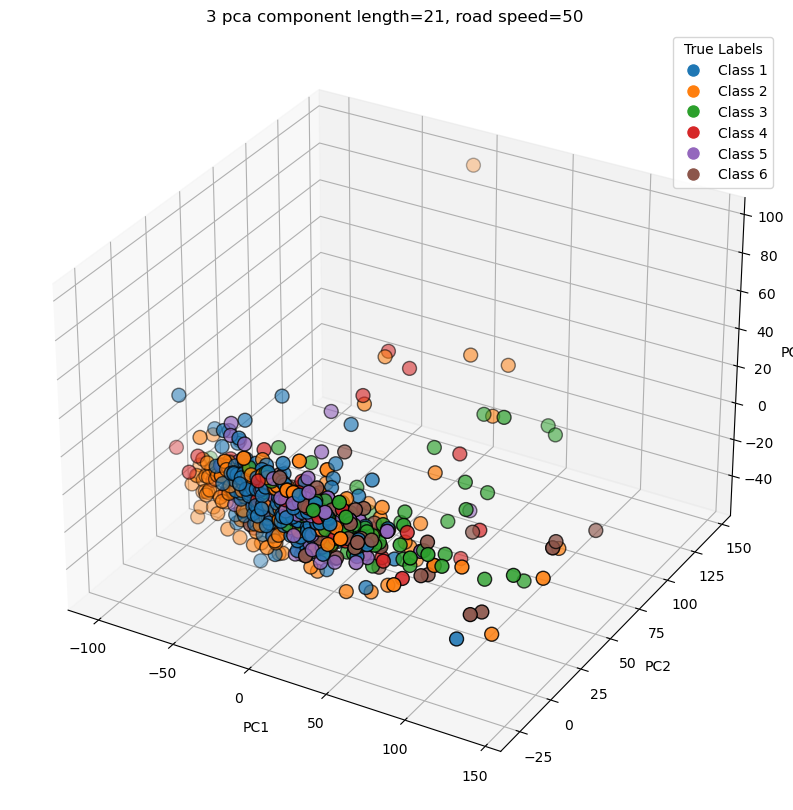

In [144]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import seaborn as sns

eps_values = [0.1, 0.5, 1.0]
min_samples_values = [5, 10, 20]
label_dict = {1: 1, 2: 0, 3: 1, 4: 0, 5: 1, 6: 1}
True_labels = [label_dict[i] for i in t_labels]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_transformed_all)



# Reduce dimensionality with PCA for visualization
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# Create a color map based on the true labels
unique_labels = np.unique(t_labels)
palette = sns.color_palette('tab10', n_colors=len(unique_labels))
label_color_map = {label: palette[i] for i, label in enumerate(unique_labels)}

# Map true labels to colors
colors = np.array([label_color_map[label] for label in t_labels])

# Plot the 3D PCA results
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, edgecolor='k', s=100)

ax.set_title(f'3 pca component length={21}, road speed={50}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Create a legend based on true labels
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=label_color_map[label], markersize=10, label=f'Class {label}') for label in unique_labels]
ax.legend(handles=handles, title='True Labels')

plt.show()


In [150]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.cluster import AgglomerativeClustering, DBSCAN, SpectralClustering
from sklearn.mixture import GaussianMixture
from sklearn.metrics import accuracy_score, adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from scipy.optimize import linear_sum_assignment
from tabulate import tabulate

def map_cluster_labels(true_labels, cluster_labels):
    # Create a cost matrix based on matching true and predicted labels
    label_set_true = np.unique(true_labels)
    label_set_pred = np.unique(cluster_labels)
    cost_matrix = np.zeros((len(label_set_true), len(label_set_pred)))
    
    for i, true_label in enumerate(label_set_true):
        for j, cluster_label in enumerate(label_set_pred):
            match_count = np.sum((true_labels == true_label) & (cluster_labels == cluster_label))
            cost_matrix[i, j] = -match_count  # Negative for cost matrix
    
    # Solve the assignment problem
    row_ind, col_ind = linear_sum_assignment(cost_matrix)
    label_mapping = {label_set_pred[j]: label_set_true[i] for i, j in zip(row_ind, col_ind)}
    
    # Map cluster labels to true labels
    mapped_labels = np.array([label_mapping[label] for label in cluster_labels])
    
    return mapped_labels

def clustering_accuracy(true_labels, predicted_labels):
    mapped_labels = map_cluster_labels(true_labels, predicted_labels)
    return accuracy_score(true_labels, mapped_labels)

def evaluate_clustering_methods_v2(data, true_labels):
    methods = {
        'KMeans': KMeans(n_clusters=len(np.unique(true_labels)), random_state=42),
        'KMedoids': KMedoids(n_clusters=len(np.unique(true_labels)), random_state=42),
        'Agglomerative': AgglomerativeClustering(n_clusters=len(np.unique(true_labels))),
        'GMM': GaussianMixture(n_components=len(np.unique(true_labels)), random_state=42),
        'Spectral': SpectralClustering(n_clusters=len(np.unique(true_labels)), affinity='nearest_neighbors', random_state=42)
    }
    
    results = {}
    
    for method_name, method in methods.items():
        if method_name == 'DBSCAN':
            predicted_labels = method.fit_predict(data)
            valid_indices = predicted_labels != -1
            acc = clustering_accuracy(true_labels[valid_indices], predicted_labels[valid_indices])
        elif method_name == 'GMM':
            predicted_labels = method.fit(data).predict(data)
            acc = clustering_accuracy(true_labels, predicted_labels)
        else:
            predicted_labels = method.fit_predict(data)
            acc = clustering_accuracy(true_labels, predicted_labels)
        
        ari = adjusted_rand_score(true_labels, predicted_labels)
        nmi = normalized_mutual_info_score(true_labels, predicted_labels)
        
        if method_name != 'DBSCAN':
            silhouette = silhouette_score(data, predicted_labels)
        else:
            silhouette = silhouette_score(data[valid_indices], predicted_labels[valid_indices])
        
        results[method_name] = {
            'Accuracy': acc,
            'ARI': ari,
            'NMI': nmi,
            'Silhouette': silhouette
        }
        
    return results

def print_results_table(results):
    # Create a DataFrame from the results dictionary
    df_results = pd.DataFrame(results).T

    # Print the DataFrame as a formatted table
    print(tabulate(df_results, headers='keys', tablefmt='pretty', floatfmt=".2f"))

# Example usage


results = evaluate_clustering_methods(X_scaled, np.array(True_labels))
print_results_table(results)
# for method, scores in results.items():
#     print(f"{method}:")
#     print(f"  Accuracy: {scores['Accuracy']:.2f}")
#     print(f"  ARI: {scores['ARI']:.2f}")
#     print(f"  NMI: {scores['NMI']:.2f}")


+---------------+--------------------+-----------------------+-----------------------+
|               |      Accuracy      |          ARI          |          NMI          |
+---------------+--------------------+-----------------------+-----------------------+
|    KMeans     | 0.6273209549071618 |  0.06328564246065518  |  0.0430744381414066   |
|   KMedoids    | 0.6007957559681698 |  0.03916171135174246  |  0.03761759150081816  |
| Agglomerative | 0.5729442970822282 | -0.01148628127906937  | 0.0037529065342998325 |
|    DBSCAN     |        nan         |          0.0          |          0.0          |
|      GMM      | 0.6273209549071618 |  0.06328564246065518  |  0.0430744381414066   |
|   Spectral    | 0.6087533156498673 | 0.0044847272281201295 | 0.0015165230384686674 |
+---------------+--------------------+-----------------------+-----------------------+


In [137]:
import pandas as pd
import numpy as np
from sktime.transformations.panel.rocket import MiniRocketMultivariate

# Define the convert_dfs_to_arrays function
def convert_dfs_to_arrays(df_list):
    arrays = []
    labels = []
    for df in df_list:
        arrays.append(df[['speed', 'acceleration_est_1', 'angular_acc']].values.T)  # Transpose to get shape (num_features, num_timesteps)
        labels.append(df.iloc[0]['group'])
    return np.stack(arrays, axis=0), labels



# Convert DataFrames to a 3D NumPy array
arrays,True_labels = convert_dfs_to_arrays(dict_length[105])

# Create the MiniRocketMultivariate transformer
rocket = MiniRocketMultivariate(num_kernels=10000)  # Adjust num_kernels as needed

# Fit the transformer on your data
rocket.fit(arrays)

# Transform the data
X_transformed = rocket.transform(arrays)

print("Transformed data shape:", X_transformed.shape)

# Apply DBSCAN
dbscan = DBSCAN(eps=2, min_samples=20)  # Adjust eps and min_samples as needed
labels = dbscan.fit_predict(X_transformed)

print("Cluster labels:", labels)


Transformed data shape: (10, 9996)
Cluster labels: [-1 -1 -1 -1 -1 -1 -1 -1 -1 -1]


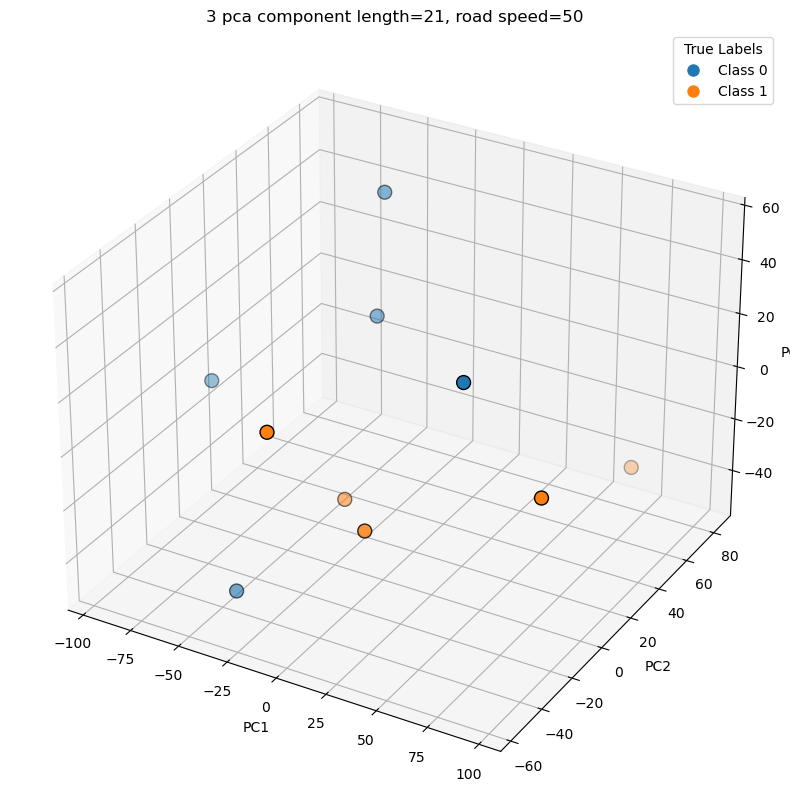

In [138]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import seaborn as sns

eps_values = [0.1, 0.5, 1.0]
min_samples_values = [5, 10, 20]
label_dict = {1: 1, 2: 0, 3: 1, 4: 0, 5: 1, 6: 1}
True_labels = [label_dict[i] for i in True_labels]

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_transformed)



# Reduce dimensionality with PCA for visualization
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# Create a color map based on the true labels
unique_labels = np.unique(True_labels)
palette = sns.color_palette('tab10', n_colors=len(unique_labels))
label_color_map = {label: palette[i] for i, label in enumerate(unique_labels)}

# Map true labels to colors
colors = np.array([label_color_map[label] for label in True_labels])

# Plot the 3D PCA results
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=colors, edgecolor='k', s=100)

ax.set_title(f'3 pca component length={21}, road speed={50}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Create a legend based on true labels
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=label_color_map[label], markersize=10, label=f'Class {label}') for label in unique_labels]
ax.legend(handles=handles, title='True Labels')

plt.show()


array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1])

In [84]:
num_channels_per_combination

NameError: name 'num_channels_per_combination' is not defined

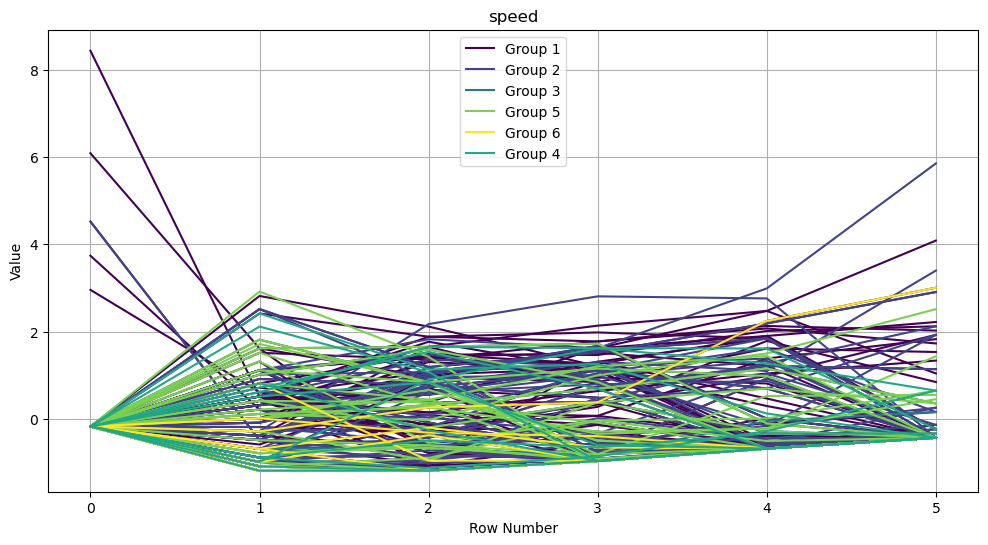

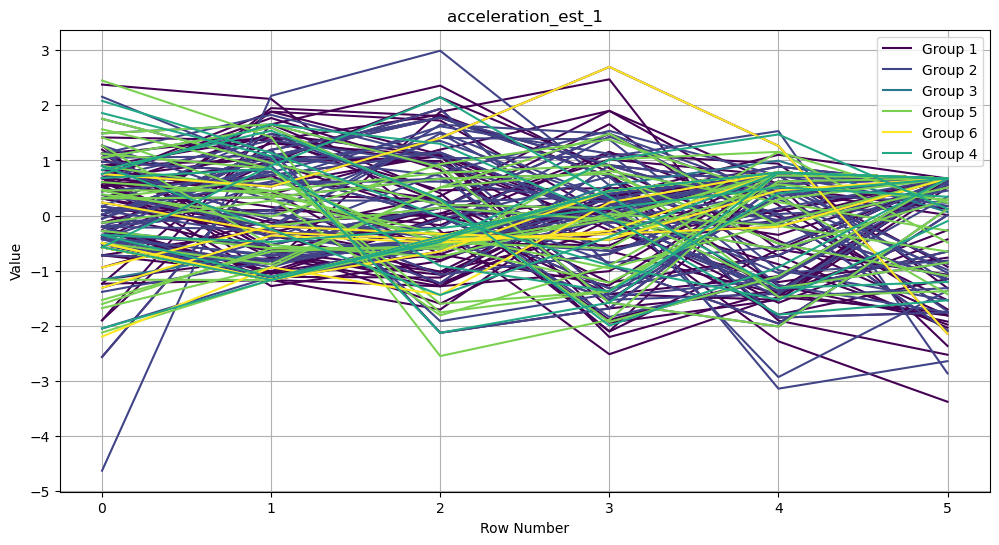

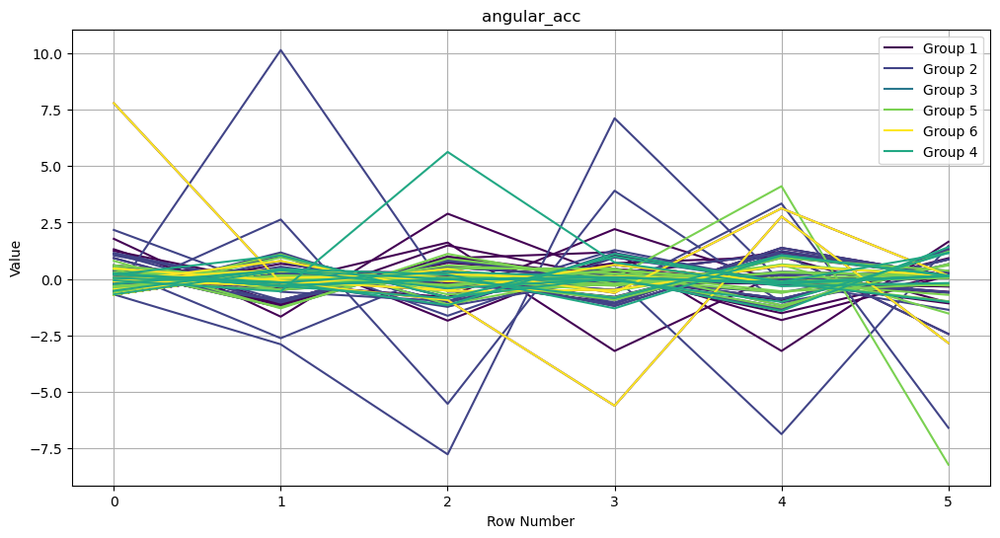

In [35]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.cm as cm
import numpy as np

def plot_multi_dimensional_time_series(dfs):
    """
    Plots a multi-dimensional time series DataFrame.
    
    Parameters:
    dfs (list of pd.DataFrame): The list of DataFrames containing the time series data. Each column is a feature.
    
    Returns:
    None
    """
    # Reset index of each DataFrame
    for df in dfs:
        df.reset_index(inplace=True, drop=True)
    
    # Define the columns to plot
    columns_to_plot = ['speed', 'acceleration_est_1', 'angular_acc']
    
    # Get unique groups
    unique_groups = [1,2,3,4,5,6]
    
    # Create a colormap
    colors = cm.get_cmap('viridis', len(unique_groups))
    
    # Plot each column
    for column in columns_to_plot:
        plt.figure(figsize=(12, 6))
        
        # Set to keep track of groups already plotted for the legend
        plotted_groups = set()
        
        for df in dfs:
            groups = df['group'].unique()
            for group in groups:
                group_df = df[df['group'] == group]
                color = colors(group - 1)  # Group values are assumed to be 1 to 6
                
                if group not in plotted_groups:
                    plt.plot(group_df.index, group_df[column], label=f'Group {group}', color=color)
                    plotted_groups.add(group)
                else:
                    plt.plot(group_df.index, group_df[column], color=color)
        
        plt.xlabel('Row Number')
        plt.ylabel('Value')
        plt.title(column)
        plt.legend()
        plt.grid(True)
        plt.show()

# Example usage:
# dfs = [df1, df2, df3]  # List of DataFrames
# plot_multi_dimensional_time_series(dfs)
def normalize_time_series(df_list):
    # Ensure all DataFrames in the list have the same shape
    for df in df_list:
        df.reset_index(inplace=True, drop=True)

    # Concatenate all DataFrames along a new axis
    concatenated = pd.concat(df_list, axis=0)
    
    columns_of_interest = ['speed', 'acceleration_est_1', 'angular_acc']

    # Group by index and calculate mean and std only for specified columns
    grouped = concatenated[columns_of_interest].groupby(concatenated.index)
    mean_series = grouped.mean()
    std_series = grouped.std()
    std_series = std_series.replace(0, 1)
    # Normalize each DataFrame in the list according to index
    normalized_list = []
    for df in df_list:
        normalized_df = df.copy()
        index_values = normalized_df.index
        
        # Normalize each column according to its index value
        for col in columns_of_interest:
            normalized_df[col] = (normalized_df[col] - mean_series.loc[index_values, col]) / std_series.loc[index_values, col]
        
        normalized_list.append(normalized_df)
    
    return normalized_list


plot_multi_dimensional_time_series(normalize_time_series(new_dict[(6, 50.0, 2)]))


In [36]:
groups_splitted_normlized_ts = {}
for key in new_dict:
    lst = normalize_time_series(new_dict[key])
    for series in lst:
        group_num = int(series.iloc[0][['group']])
        groups_splitted_normlized_ts[group_num] = groups_splitted_normlized_ts.get(group_num,[])
        groups_splitted_normlized_ts[group_num].append(series)

In [31]:
groups_splitted_normlized_ts[1]

[   longitude   latitude           orig_time     speed  road_speed  \
 0  34.857773  32.165485 2018-01-05 06:01:49  0.000000        50.0   
 1  34.857773  32.165488 2018-01-05 06:01:53 -0.875269        50.0   
 2  34.857770  32.165486 2018-01-05 06:01:57 -0.943851        50.0   
 3  34.857770  32.165493 2018-01-05 06:02:01 -0.887285        50.0   
 4  34.857771  32.165495 2018-01-05 06:02:05 -0.745343        50.0   
 5  34.857775  32.165501 2018-01-05 06:02:09 -0.402530        50.0   
 
    acceleration_est_1  angular_acc      hour     drive_id  group  
 0           -0.485412    -0.812711  06:01:49  12808103918      1  
 1           -0.949477     0.386755  06:01:53  12808103918      1  
 2           -0.494748     0.179404  06:01:57  12808103918      1  
 3            0.317097    -0.193110  06:02:01  12808103918      1  
 4            0.760646     0.228199  06:02:05  12808103918      1  
 5            0.746932    -0.093281  06:02:09  12808103918      1  ,
    longitude   latitude       

In [32]:
# from fastdtw import fastdtw
# from scipy.spatial.distance import euclidean
# import numpy as np

# features =['speed','acceleration_est_1','angular_acc']

# def calculate_dtw(series1, series2):
#     distance, _ = fastdtw(series1, series2, dist=euclidean)
#     return distance

# distances_toothers = {}

# for group in groups_splitted_normlized_ts:
#     for group2 in groups_splitted_normlized_ts:
#         for series1 in groups_splitted_normlized_ts[group]:
#             for series2 in groups_splitted_normlized_ts[group2]:
#                 series1.dropna(inplace=True)
#                 series2.dropna(inplace=True)
#                 distances_toothers[(group,group2)] = distances_toothers.get((group,group2),[])
#                 distances_toothers[(group,group2)].append(calculate_dtw(series1[features],series2[features]))


In [33]:
directory_path = "/bigdata/users-home/dor/transpotation research/agg_data/dtw/"
file_name = "dtw_distance_groups_dict.pkl"

# Combine the directory path and file name
file_path = os.path.join(directory_path, file_name)

# Save the dictionary as a pickle file
with open(file_path, 'wb') as file:
    pickle.dump(distances_toothers, file)

print(f"Dictionary saved as pickle file at {file_path}")

Dictionary saved as pickle file at /bigdata/users-home/dor/transpotation research/agg_data/dtw/dtw_distance_groups_dict.pkl


In [40]:
directory_path = "/bigdata/users-home/dor/transpotation research/agg_data/dtw/"
file_name = "dtw_distance_groups_dict.pkl"

# Combine the directory path and file name
file_path = os.path.join(directory_path, file_name)
with open(file_path, 'rb') as file:
    distances_toothers = pickle.load(file)

print("Dictionary loaded from pickle file:")


Dictionary loaded from pickle file:


In [41]:
distances_toothers

{(1, 1): [0.0,
  0.0,
  15.348276282980432,
  9.242176554187175,
  9.026898016737052,
  0.0,
  14.091372363300355,
  0.20876200967404063,
  16.920739503007624,
  8.667164039988615,
  12.727985601439215,
  15.36266896189865,
  2.608212995697796,
  11.514619435519794,
  15.925450503449936,
  19.97920505626874,
  15.235245839513066,
  17.49618284397824,
  19.42136884204348,
  0.0,
  15.986718678591897,
  0.0,
  0.0,
  8.41478143045129,
  13.715277664191026,
  7.280055535769134,
  6.9540970482732565,
  0.0,
  3.6871929728680852,
  13.434575105021995,
  7.593497478446758,
  14.145737559639274,
  11.191841875994108,
  4.471204387611219,
  12.806783033863937,
  15.275430909124704,
  31.886695824050193,
  28.45436884480929,
  23.768243389088603,
  14.30044575576578,
  22.998080886415497,
  22.47152585120862,
  15.076442301156028,
  14.565815148562102,
  23.055669236754625,
  15.812087290230636,
  22.520282307156535,
  23.141858873411817,
  16.797435790920648,
  26.76349351351733,
  24.35668566

In [42]:
for group in groups_splitted_normlized_ts:
    print(group, len(groups_splitted_normlized_ts[group]))
for group in distances_toothers:
    print(group,len(distances_toothers[group]))

1 1491
2 1019
3 342
5 470
6 248
4 294
(1, 1) 2223081
(1, 2) 1519329
(1, 3) 509922
(1, 5) 700770
(1, 6) 369768
(1, 4) 438354
(2, 1) 1519329
(2, 2) 1038361
(2, 3) 348498
(2, 5) 478930
(2, 6) 252712
(2, 4) 299586
(3, 1) 509922
(3, 2) 348498
(3, 3) 116964
(3, 5) 160740
(3, 6) 84816
(3, 4) 100548
(5, 1) 700770
(5, 2) 478930
(5, 3) 160740
(5, 5) 220900
(5, 6) 116560
(5, 4) 138180
(6, 1) 369768
(6, 2) 252712
(6, 3) 84816
(6, 5) 116560
(6, 6) 61504
(6, 4) 72912
(4, 1) 438354
(4, 2) 299586
(4, 3) 100548
(4, 5) 138180
(4, 6) 72912
(4, 4) 86436


In [43]:
def mean_of_n_numbers(lst, n):
    if n <= 0:
        raise ValueError("n must be a positive integer")
    if not lst:
        return []

    means = []
    for i in range(0, len(lst), n):
        chunk = lst[i:i + n]
        chunk_mean = sum(chunk) / len(chunk)
        means.append(chunk_mean)

    return means

# Example usage:


for group in groups_splitted_normlized_ts:
    distances_toothers[(group,group)] = mean_of_n_numbers(distances_toothers[(group,group)],len(groups_splitted_normlized_ts[group]))

In [44]:
for group in distances_toothers:
    print(group,len(distances_toothers[group]))
    
def find_outliers(data):
    mean = np.mean(data)
    std_dev = np.std(data)
    outliers = []
    
    for i, value in enumerate(data):
        z_score = (value - mean) / std_dev
        if abs(z_score) > 3:
            outliers.append(i)
    
    return outliers
outliars_index_dict = {}
for group in groups_splitted_normlized_ts:
    outliars_index_dict[group] = find_outliers(distances_toothers[(group,group)])
    
print(outliars_index_dict)

(1, 1) 1491
(1, 2) 1519329
(1, 3) 509922
(1, 5) 700770
(1, 6) 369768
(1, 4) 438354
(2, 1) 1519329
(2, 2) 1019
(2, 3) 348498
(2, 5) 478930
(2, 6) 252712
(2, 4) 299586
(3, 1) 509922
(3, 2) 348498
(3, 3) 342
(3, 5) 160740
(3, 6) 84816
(3, 4) 100548
(5, 1) 700770
(5, 2) 478930
(5, 3) 160740
(5, 5) 470
(5, 6) 116560
(5, 4) 138180
(6, 1) 369768
(6, 2) 252712
(6, 3) 84816
(6, 5) 116560
(6, 6) 248
(6, 4) 72912
(4, 1) 438354
(4, 2) 299586
(4, 3) 100548
(4, 5) 138180
(4, 6) 72912
(4, 4) 294
{1: [198, 481, 486, 493, 510, 646, 650, 845, 998, 1004, 1098, 1118, 1122, 1143, 1336, 1339, 1344, 1390, 1408, 1429, 1430, 1433, 1487], 2: [200, 319, 391, 668, 682, 686, 802, 935, 969, 975, 1009], 3: [111, 178, 179, 254, 255, 318], 5: [171, 172, 216, 217, 298, 338, 426, 450, 468], 6: [113, 121, 173, 175], 4: [39, 210, 222, 259]}


In [45]:
def remove_elements_at_indexes(numbers, indexes):
    # Convert the list of indexes to a set for faster membership testing
    indexes_set = set(indexes)
    
    # Create a new list that includes only the elements not in the indexes set
    result = [num for i, num in enumerate(numbers) if i not in indexes_set]
    
    return result

In [46]:
def remove_numbers(data_list, indexes, n, m):
    # Sort indexes in descending order to avoid shifting problems
    sorted_indexes = sorted(indexes, reverse=True)
    
    for index in sorted_indexes:
        start_index = m * index
        end_index = start_index + n
        del data_list[start_index:end_index]
    
    return data_list

def remove_indexes_every_n(data_list, indexes, n):
    result = []
    for i in range(0, len(data_list), n):
        chunk = data_list[i:i + n]
        filtered_chunk = [chunk[j] for j in range(len(chunk)) if j not in indexes]
        result.extend(filtered_chunk)
    return result

In [47]:
for group in distances_toothers:
    if group[0] != group[1]:
        
        n = len(groups_splitted_normlized_ts[group[1]])
        distances_toothers[group] = remove_numbers(distances_toothers[group],outliars_index_dict[group[0]],n,n)
        distances_toothers[group] = remove_indexes_every_n(distances_toothers[group],outliars_index_dict[group[1]],n)
    else:
        distances_toothers[group] = remove_elements_at_indexes(distances_toothers[group], outliars_index_dict[group[0]])

In [48]:
for group in distances_toothers:
    print(group,len(distances_toothers[group]))
    

(1, 1) 1468
(1, 2) 1479744
(1, 3) 493248
(1, 5) 676748
(1, 6) 358192
(1, 4) 425720
(2, 1) 1479744
(2, 2) 1008
(2, 3) 338688
(2, 5) 464688
(2, 6) 245952
(2, 4) 292320
(3, 1) 493248
(3, 2) 338688
(3, 3) 336
(3, 5) 154896
(3, 6) 81984
(3, 4) 97440
(5, 1) 676748
(5, 2) 464688
(5, 3) 154896
(5, 5) 461
(5, 6) 112484
(5, 4) 133690
(6, 1) 358192
(6, 2) 245952
(6, 3) 81984
(6, 5) 112484
(6, 6) 244
(6, 4) 70760
(4, 1) 425720
(4, 2) 292320
(4, 3) 97440
(4, 5) 133690
(4, 6) 70760
(4, 4) 290


In [49]:
for group in distances_toothers:
    if group[0] != group[1]:
        distances_toothers[group] = mean_of_n_numbers(distances_toothers[group],len(distances_toothers[(group[0],group[0])]))

In [50]:
for group in distances_toothers:
    distances_toothers[group] = np.mean(distances_toothers[group])

In [51]:
for group in distances_toothers:
    if group[0] != group[1]:
        distances_toothers[group] = distances_toothers[group]/np.mean([distances_toothers[(group[0],group[0])],distances_toothers[(group[1],group[1])]])
    print(group,distances_toothers[group])
    

(1, 1) 19.925525574802187
(1, 2) 0.9889144947572038
(1, 3) 0.9909990172467381
(1, 5) 0.9876695536588185
(1, 6) 0.9932894970384738
(1, 4) 0.9988376499532842
(2, 1) 0.9889267509102242
(2, 2) 23.579119057566952
(2, 3) 0.9902164770556939
(2, 5) 0.9902959300666635
(2, 6) 0.9926329978308271
(2, 4) 0.9974812530710212
(3, 1) 0.9903527212064338
(3, 2) 0.9897713961422595
(3, 3) 20.04817313986513
(3, 5) 0.9905670586027495
(3, 6) 0.990498485811038
(3, 4) 0.9997910808597931
(5, 1) 0.9877621968152485
(5, 2) 0.9904216415141339
(5, 3) 0.9911743383802445
(5, 5) 19.65770425201089
(5, 6) 0.9875677937838097
(5, 4) 1.0079670357339183
(6, 1) 0.9934124653829555
(6, 2) 0.9927196260029943
(6, 3) 0.9912107918212749
(6, 5) 0.9876609607245362
(6, 6) 20.61445034195824
(6, 4) 1.0127122456153552
(4, 1) 0.9987645287440137
(4, 2) 0.9974784216502275
(4, 3) 1.0001253993932506
(4, 5) 1.0077775610857735
(4, 6) 1.0125470483732268
(4, 4) 22.038094645553976


In [91]:
# for group in distances_toothers:
#     if group[0] == group[1]:
#         distances_toothers[group] = distances_toothers[group]/distances_toothers[(group[0],group[0])]

In [52]:
for group in distances_toothers:
    distances_toothers[(group[1],group[0])] = distances_toothers[group]


In [ ]:
file_path = "/bigdata/users-home/dor/transpotation research/agg_data/grouped_neighbors.pickle"

# Read the pickle file
with open(file_path, 'rb') as handle:
    neighbors_dict = pickle.load(handle)

In [114]:
import numpy as np
from sklearn.manifold import MDS
from sklearn.cluster import KMeans

distance_dict =distances_toothers
# Extract unique labels
labels = sorted(set([key[0] for key in distance_dict.keys()] + [key[1] for key in distance_dict.keys()]))

# Initialize the distance matrix
distance_matrix = np.zeros((len(labels), len(labels)))

# Populate the distance matrix
for (i, label1) in enumerate(labels):
    for (j, label2) in enumerate(labels):
        if i != j:
            distance_matrix[i, j] = distance_dict.get((label1, label2), distance_dict.get((label2, label1), 0))

print(distance_matrix)
# Apply Multidimensional Scaling (MDS)
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coordinates = mds.fit_transform(distance_matrix)

# Apply k-means clustering
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(coordinates)
labels_kmeans = kmeans.labels_

# Display the results
clustered_groups = {label: [] for label in range(kmeans.n_clusters)}
for i, label in enumerate(labels_kmeans):
    clustered_groups[label].append((labels[i],neighbors_dict[labels[i]]))
    
print(clustered_groups)

[[0.         0.98891449 0.99099902 0.99883765 0.98766955 0.9932895 ]
 [0.98891449 0.         0.99021648 0.99748125 0.99029593 0.992633  ]
 [0.99099902 0.99021648 0.         0.99979108 0.99056706 0.99049849]
 [0.99883765 0.99748125 0.99979108 0.         1.00796704 1.01271225]
 [0.98766955 0.99029593 0.99056706 1.00796704 0.         0.98756779]
 [0.9932895  0.992633   0.99049849 1.01271225 0.98756779 0.        ]]
{0: [(2, 'Tel Aviv University'), (3, 'Neot Uzi'), (4, 'Herzliya Pituach')], 1: [(1, 'Hadar-Yosef'), (5, 'Neot afeka a.'), (6, 'Rom 2000')]}


In [58]:
import numpy as np
from sklearn.manifold import MDS
from sklearn_extra.cluster import KMedoids
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans

distance_dict =distances_toothers
# Extract unique labels
labels = sorted(set([key[0] for key in distance_dict.keys()] + [key[1] for key in distance_dict.keys()]))

# Initialize the distance matrix
distance_matrix = np.zeros((len(labels), len(labels)))

# Populate the distance matrix
for (i, label1) in enumerate(labels):
    for (j, label2) in enumerate(labels):
        if i != j:
            distance_matrix[i, j] = distance_dict.get((label1, label2), distance_dict.get((label2, label1), 0))

print("Distance Matrix:")
print(distance_matrix)

# Apply Multidimensional Scaling (MDS)
# mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
coordinates = mds.fit_transform(distance_matrix)

# Determine the optimal number of clusters (k) using the Silhouette score
silhouette_scores = []
max_k = 5  # Define the range of k to test
best_k = 2
best_silhouette_score = -1

for k in range(2, max_k + 1):
    kmedoids = KMedoids(n_clusters=k, metric='precomputed', random_state=42)
    kmedoids.fit(distance_matrix)
    labels_kmedoids = kmedoids.labels_
    
    # Calculate the silhouette score
    silhouette_avg = silhouette_score(coordinates, labels_kmedoids)
    silhouette_scores.append((k, silhouette_avg))
    
    if silhouette_avg > best_silhouette_score:
        best_k = k
        best_silhouette_score = silhouette_avg

# Print silhouette scores for different k
print("Silhouette scores for different k:")
for k, score in silhouette_scores:
    print(f"k={k}, Silhouette Score={score}")

print(f"\nBest k found: {best_k} with Silhouette Score: {best_silhouette_score}")

# Apply K-Medoids with the best k
kmedoids = KMedoids(n_clusters=best_k, metric='precomputed', random_state=42)
kmedoids.fit(distance_matrix)
labels_kmedoids = kmedoids.labels_

# Display the results
clustered_groups = {label: [] for label in range(kmedoids.n_clusters)}
for i, label in enumerate(labels_kmedoids):
    clustered_groups[label].append((labels[i], neighbors_dict[labels[i]]))

print("\nClustered Groups:")
for cluster_id, group in clustered_groups.items():
    print(f"Cluster {cluster_id}: {group}")


Distance Matrix:
[[0.         0.98891449 0.99099902 0.99883765 0.98766955 0.9932895 ]
 [0.98891449 0.         0.99021648 0.99748125 0.99029593 0.992633  ]
 [0.99099902 0.99021648 0.         0.99979108 0.99056706 0.99049849]
 [0.99883765 0.99748125 0.99979108 0.         1.00796704 1.01271225]
 [0.98766955 0.99029593 0.99056706 1.00796704 0.         0.98756779]
 [0.9932895  0.992633   0.99049849 1.01271225 0.98756779 0.        ]]
Silhouette scores for different k:
k=2, Silhouette Score=0.19229770046714634
k=3, Silhouette Score=-0.09814018741455051
k=4, Silhouette Score=-0.2852990310412275
k=5, Silhouette Score=-0.1378466559060781

Best k found: 2 with Silhouette Score: 0.19229770046714634

Clustered Groups:
Cluster 0: [(2, 'Tel Aviv University'), (3, 'Neot Uzi'), (4, 'Herzliya Pituach'), (6, 'Rom 2000')]
Cluster 1: [(1, 'Hadar-Yosef'), (5, 'Neot afeka a.')]


In [61]:
import numpy as np
from sklearn.manifold import MDS
from sklearn.cluster import KMeans

distance_dict =distances_toothers
# Extract unique labels
labels = sorted(set([key[0] for key in distance_dict.keys()] + [key[1] for key in distance_dict.keys()]))

# Initialize the distance matrix
distance_matrix = np.zeros((len(labels), len(labels)))

# Populate the distance matrix
for (i, label1) in enumerate(labels):
    for (j, label2) in enumerate(labels):
        if i != j:
            distance_matrix[i, j] = distance_dict.get((label1, label2), distance_dict.get((label2, label1), 0))

print(distance_matrix)

# Determine the optimal number of clusters (k) using the Silhouette score
silhouette_scores = []
max_k = 5  # Define the range of k to test
best_k = 2
best_silhouette_score = -1

for k in range(2, max_k + 1):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(distance_matrix)
    labels_kmeans = kmeans.labels_
    
    # Calculate the silhouette score
    silhouette_avg = silhouette_score(distance_matrix, labels_kmeans)
    silhouette_scores.append((k, silhouette_avg))
    
    if silhouette_avg > best_silhouette_score:
        best_k = k
        best_silhouette_score = silhouette_avg

# Print silhouette scores for different k
print("Silhouette scores for different k:")
for k, score in silhouette_scores:
    print(f"k={k}, Silhouette Score={score}")

print(f"\nBest k found: {best_k} with Silhouette Score: {best_silhouette_score}")


# Apply k-means clustering
kmeans = KMeans(n_clusters=best_k, random_state=42)
kmeans.fit(distance_matrix)
labels_kmeans = kmeans.labels_

# Display the results
clustered_groups = {label: [] for label in range(kmeans.n_clusters)}
for i, label in enumerate(labels_kmeans):
    clustered_groups[label].append((labels[i],neighbors_dict[labels[i]]))
    
print(clustered_groups)

[[0.         0.98891449 0.99099902 0.99883765 0.98766955 0.9932895 ]
 [0.98891449 0.         0.99021648 0.99748125 0.99029593 0.992633  ]
 [0.99099902 0.99021648 0.         0.99979108 0.99056706 0.99049849]
 [0.99883765 0.99748125 0.99979108 0.         1.00796704 1.01271225]
 [0.98766955 0.99029593 0.99056706 1.00796704 0.         0.98756779]
 [0.9932895  0.992633   0.99049849 1.01271225 0.98756779 0.        ]]
Silhouette scores for different k:
k=2, Silhouette Score=0.003254233487175832
k=3, Silhouette Score=0.001090745221403422
k=4, Silhouette Score=0.001229001642216482
k=5, Silhouette Score=0.0005181907061866409

Best k found: 2 with Silhouette Score: 0.003254233487175832
{0: [(2, 'Tel Aviv University'), (3, 'Neot Uzi'), (4, 'Herzliya Pituach')], 1: [(1, 'Hadar-Yosef'), (5, 'Neot afeka a.'), (6, 'Rom 2000')]}


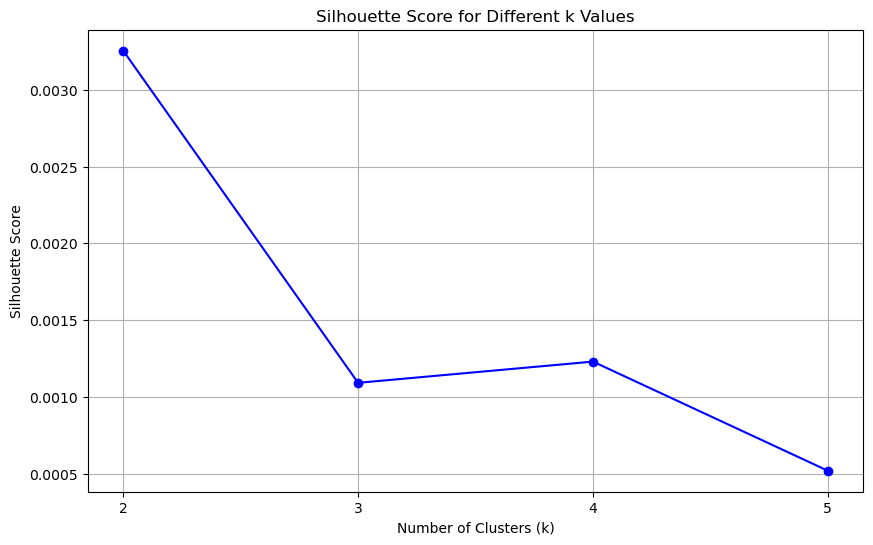

In [62]:
k_values, scores = zip(*silhouette_scores)
plt.figure(figsize=(10, 6))
plt.plot(k_values, scores, marker='o', linestyle='-', color='b')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different k Values')
plt.xticks(k_values)
plt.grid(True)
plt.show()

In [55]:
!pip install scikit-learn-extra


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 3.6 MB/s eta 0:00:0000:0100:01


In [59]:
def remove_indexes_every_n(data_list, indexes, n):
    result = []
    for i in range(0, len(data_list), n):
        chunk = data_list[i:i + n]
        filtered_chunk = [chunk[j] for j in range(len(chunk)) if j not in indexes]
        result.extend(filtered_chunk)
    return result

# Example usage
data_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
indexes = [0, 2]
n = 3

result = remove_indexes_every_n(data_list, indexes, n)
print(result)



[2, 5, 8, 11]


In [43]:
for group in distances_toothers:
    print(group,len(distances_toothers[group]))
    

(1, 1) 1491
(1, 2) 1019
(1, 3) 342
(1, 5) 470
(1, 6) 248
(1, 4) 294
(2, 1) 1491
(2, 2) 1019
(2, 3) 342
(2, 5) 470
(2, 6) 248
(2, 4) 294
(3, 1) 1491
(3, 2) 1019
(3, 3) 342
(3, 5) 470
(3, 6) 248
(3, 4) 294
(5, 1) 1491
(5, 2) 1019
(5, 3) 342
(5, 5) 470
(5, 6) 248
(5, 4) 294
(6, 1) 1491
(6, 2) 1019
(6, 3) 342
(6, 5) 470
(6, 6) 248
(6, 4) 294
(4, 1) 1491
(4, 2) 1019
(4, 3) 342
(4, 5) 470
(4, 6) 248
(4, 4) 294


In [44]:
def remove_elements_at_indexes(numbers, indexes):
    # Convert the list of indexes to a set for faster membership testing
    indexes_set = set(indexes)
    
    # Create a new list that includes only the elements not in the indexes set
    result = [num for i, num in enumerate(numbers) if i not in indexes_set]
    
    return result

# Example usage:
numbers = [10, 20, 30, 40, 50]
indexes = [1, 3]
print(remove_elements_at_indexes(numbers, indexes))  # Output: [10, 30, 50]


[10, 30, 50]


In [118]:
from sktime.datatypes._panel._convert import from_2d_array_to_nested
def convert_df_to_sktime(df: pd.DataFrame, columns: list[str]=['speed', 'acceleration_est_1', 'angular_acc'], index=0) -> pd.DataFrame:
    """
    Convert single pd.DataFrame to sktime format
    Extract each column as a pd.Series and write them into DataFrame cells
        
    :param df: pd.DataFrame with multiple features
    :param columns: provide column names to be extraced
    :param index: provide specific index to access by row
    :return: pd.DataFrame with single row, each cell = pd.Series of feature
    
    ToDo: catch error when column doesn't exist in df (or let it crash?)
    """
    if columns is None:
        columns = df.columns
        
    ts = pd.DataFrame(index=[index],columns=columns)
    for column in columns:
        ts.at[index, column] = [df[column]]
    
    return ts

def convert_list_to_ts_df(lst):
    i=1
    csv_ts_list=[]
    for series in lst:
        csv_ts_i = convert_df_to_sktime(df=series, index=i)
        csv_ts_list.append(csv_ts_i)
        i+=1
    csv_ts = pd.concat(csv_ts_list)
    for column in csv_ts.columns:
        # Convert each column to a nested format
        csv_ts[column] = from_2d_array_to_nested(np.vstack(csv_ts[column].apply(np.array).values))
    csv_ts.dropna(inplace=True)
    return csv_ts


In [119]:
# for series in new_dict[(6, 50.0, 2)]:
#     series.set_index('orig_time', inplace=True)
convert_list_to_ts_df(normalize_time_series(new_dict[(6, 50.0, 2)]))

,speed,acceleration_est_1,angular_acc
1,0 -0.175861 1 0.011808 2 -0.317978 3 ...,0 0.237883 1 -0.304904 2 -0.438861 3 ...,0 -0.071647 1 -0.298900 2 0.440361 3 ...
2,0 3.737044 1 0.211974 2 -0.260105 3 ...,0 -0.264814 1 -1.011074 2 -0.028508 3 ...,0 -0.681487 1 0.341579 2 -0.064308 3 ...
3,0 -0.175861 1 -0.088276 2 1.360349 3 ...,0 -1.237609 1 1.366845 2 1.830854 3 ...,0 -0.649049 1 0.362727 2 0.015314 3 ...
4,0 -0.175861 1 0.512224 2 1.765462 3 ...,0 0.680530 1 1.770370 2 0.827956 3 ...,0 0.379246 1 -1.185865 2 0.947487 3 ...
5,0 -0.175861 1 0.412141 2 0.087135 3 ...,0 -0.204765 1 0.098621 2 -1.072270 3 ...,0 1.102620 1 -0.313283 2 0.021176 3 ...
...,...,...,...
173,0 -0.175861 1 -1.189193 2 -1.186078 3 ...,0 -0.573638 1 -1.169602 2 -0.386077 3 ...,0 -0.681487 1 0.372316 2 0.000657 3 ...
174,0 -0.175861 1 2.413809 2 1.128855 3 ...,0 2.082248 1 1.136258 2 -0.016589 3 ...,0 0.223542 1 -0.296503 2 0.000657 3 ...
175,0 -0.175861 1 0.612308 2 1.649715 3 ...,0 0.754305 1 1.655077 2 1.303013 3 ...,0 0.249492 1 -0.313283 2 -0.019863 3 ...
176,0 -0.175861 1 0.512224 2 0.839489 3 ...,0 0.680530 1 0.848026 2 -0.913918 3 ...,0 0.220298 1 -0.145479 2 -1.160162 3 ...


In [122]:
import pandas as pd
from sklearn.linear_model import RidgeClassifierCV
from sklearn.metrics import accuracy_score
from sktime.transformations.panel.rocket import Rocket



# Concatenate all the nested DataFrames
X =convert_list_to_ts_df(normalize_time_series(new_dict[(6, 50.0, 2)]))
# Example usage with ROCKET classifier

# Assuming 'group' is the target variable
y = [int(df.iloc[0][['group']]) for df in new_dict[(6, 50.0, 2)]][0:177]
# Initialize and fit the ROCKET classifier
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Initialize and fit the ROCKET transformer
rocket = Rocket()
rocket.fit(X_train)

X_train_transform = rocket.transform(X_train)
X_test_transform = rocket.transform(X_test)

# # Fit ROCKET on training data




# # Train a classifier on the transformed data
classifier = RidgeClassifierCV(alphas=np.logspace(-3, 3, 10))
classifier.fit(X_train_transform, y_train)

# # Predict and evaluate on the test data
y_pred = classifier.predict(X_test_transform)
accuracy = accuracy_score(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
# # t=prepare_rocket_data_from_list(normalize_time_series(new_

Accuracy: 0.50


1.Neighborhood: Hadar-Yosef | Number of drives: 243 ---hili
---------------------------------------------------------------

2.Neighborhood: Tel Aviv University | Number of drives: 228 ---irad
---------------------------------------------------------------

3.Neighborhood: Neot Uzi | Number of drives: 124 ---hili
---------------------------------------------------------------

4.Neighborhood: Neot afeka a. | Number of drives: 83 ---hilit
---------------------------------------------------------------

5.Neighborhood: Rom 2000 | Number of drives: 80 ---hili
---------------------------------------------------------------

6.Neighborhood: Herzliya Pituach | Number of drives: 70 ---irad
---------------------------------------------------------------

In [61]:
import pandas as pd
from sktime.datatypes._panel._convert import from_2d_array_to_nested
from sktime.datatypes._panel._convert import from_nested_to_2d_array
import pandas as pd


# Assuming dfs is a list of DataFrames, each DataFrame having the columns 'speed', 'acceleration_est_1', 'angular_acc', and 'group'

# Function to convert a single DataFrame
def convert_to_nested(df):
    nested_df = pd.DataFrame({
        'speed': from_2d_array_to_nested(df[['speed']].to_numpy()),
        'acceleration_est_1': from_2d_array_to_nested(df[['acceleration_est_1']].to_numpy()),
        'angular_acc': from_2d_array_to_nested(df[['angular_acc']].to_numpy()),
        'group': df['group']  # assuming 'group' is not a time series, but a categorical variable
    })
    return nested_df

# Apply the function to each DataFrame in the list
nested_dfs = [convert_to_nested(df) for df in normalize_time_series(new_dict[(6, 50.0, 2)])]

# Concatenate all the nested DataFrames
nested_data = pd.concat(nested_dfs, axis=0)

# Example usage with ROCKET classifier
from sktime.classification.kernel_based import ROCKETClassifier

# Assuming 'group' is the target variable
X = nested_data.drop(columns=['group'])
y = nested_data['group']

# Initialize and fit the ROCKET classifier
rocket = ROCKETClassifier()
rocket.fit(X, y)

# t=prepare_rocket_data_from_list(normalize_time_series(new_dict[(6, 50.0, 2)]))

TypeError: Unsupported input data type in Rocket, input X must be in an sktime compatible format. Allowed scitypes for X in transformations are Series, Panel or Hierarchical, for instance a pandas.DataFrame with sktime compatible time indices, or with MultiIndex and last(-1) level an sktime compatible time index. Allowed compatible mtype format specifications are: ['pd.Series', 'pd.DataFrame', 'np.ndarray', 'nested_univ', 'numpy3D', 'pd-multiindex', 'df-list', 'pd_multiindex_hier'] . See the data format tutorial examples/AA_datatypes_and_datasets.ipynb. If you think the data is already in an sktime supported input format, run sktime.datatypes.check_raise(data, mtype) to diagnose the error, where mtype is the string of the type specification you want. Error message for checked mtypes, in format [mtype: message], as follows: [pd.Series: X must be a pandas.Series, found <class 'pandas.core.frame.DataFrame'>]  [pd.DataFrame: X should not have column of 'object' dtype]  [np.ndarray: X must be a numpy.ndarray, found <class 'pandas.core.frame.DataFrame'>]  [nested_univ: X entries must be pd.Series]  [numpy3D: X must be a numpy.ndarray, found <class 'pandas.core.frame.DataFrame'>]  [pd-multiindex: X must have a MultiIndex, found <class 'pandas.core.indexes.numeric.Int64Index'>]  [df-list: X must be list of pd.DataFrame, found <class 'pandas.core.frame.DataFrame'>]  [pd_multiindex_hier: X must have a MultiIndex, found <class 'pandas.core.indexes.numeric.Int64Index'>] 

TypeError: input should not have column of 'object' dtype

In [227]:
[val[0] for val in df[['speed']].values]

[0, 9, 25, 26, 51, 35]

In [124]:
import numpy as np
import pandas as pd
from sklearn.linear_model import RidgeClassifierCV
from sklearn.metrics import accuracy_score
from sktime.transformations.panel.rocket import Rocket
from sktime.datasets import load_basic_motions

# Load dataset
X_train, y_train = load_basic_motions(split="train", return_X_y=True)
X_test, y_test = load_basic_motions(split="test", return_X_y=True)

# Initialize ROCKET
rocket = Rocket()

# Fit ROCKET on training data
rocket.fit(X_train)

# Transform the training and test data
X_train_transform = rocket.transform(X_train)
X_test_transform = rocket.transform(X_test)

# Train a classifier on the transformed data
classifier = RidgeClassifierCV(alphas=np.logspace(-3, 3, 10))
classifier.fit(X_train_transform, y_train)

# Predict and evaluate on the test data
y_pred = classifier.predict(X_test_transform)
accuracy = accuracy_score(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.97


In [125]:
X_train_transform

,0,1,2,3,4,5,6,7,8,9,...,19990,19991,19992,19993,19994,19995,19996,19997,19998,19999
0,0.535714,8.352796,0.43,7.837196,0.59,21.606630,0.46,12.079043,0.4375,10.681042,...,0.28,9.509588,0.53,24.986601,0.4,6.683167,0.59,12.186052,0.48,10.454805
1,0.642857,19.207693,0.37,11.589165,0.66,25.267784,0.28,23.098969,0.4875,14.096139,...,0.26,23.858881,0.64,21.073780,0.5,13.293362,0.60,12.525493,0.46,10.781985
2,0.607143,10.205908,0.43,6.062028,0.59,16.481802,0.44,7.580502,0.4250,8.767812,...,0.47,6.018360,0.52,20.549988,0.4,3.253771,0.55,10.608713,0.47,6.769820
3,0.607143,9.852895,0.47,6.652688,0.48,22.340290,0.45,15.299870,0.4625,7.533977,...,0.36,9.165762,0.48,17.626110,0.9,8.888342,0.46,8.996256,0.49,6.840215
4,0.464286,12.096297,0.39,6.297182,0.54,14.681085,0.50,10.280704,0.4875,7.847958,...,0.36,8.022762,0.58,19.209129,0.3,2.349074,0.56,11.317927,0.51,6.631496
5,0.464286,8.872663,0.33,11.054633,0.60,29.139469,0.44,19.078745,0.4375,4.525422,...,0.29,8.872594,0.58,35.054195,0.7,8.307842,0.54,10.167830,0.44,7.229696
6,0.607143,11.227209,0.36,7.740467,0.64,13.270152,0.41,22.153147,0.4375,11.176473,...,0.33,6.061453,0.63,18.925915,0.5,11.163212,0.57,9.631888,0.41,11.132206
7,0.535714,5.469532,0.45,7.385043,0.52,13.469290,0.49,10.745785,0.4750,8.134720,...,0.43,5.459506,0.56,18.388922,0.5,6.699480,0.52,11.737314,0.51,7.255149
8,0.500000,8.191775,0.35,11.287354,0.59,26.498034,0.41,9.175777,0.4625,11.531028,...,0.34,7.542873,0.53,19.021223,0.2,2.135765,0.54,10.191088,0.49,6.615985
9,0.607143,14.474760,0.39,5.785448,0.56,17.156065,0.50,23.231506,0.5000,15.609712,...,0.39,6.555897,0.55,15.892693,0.5,8.135836,0.61,7.622157,0.45,7.318223


In [54]:
def get_all_directory_paths(path):
    directory_paths = []
    
    # Walk through the directory tree
    for files in os.listdir(path):
        p = os.path.join(path, files)
       
        if os.path.isdir(p) and len(files)<6:
            directory_paths.append(p)
    
    return directory_paths


In [69]:
get_pickle_files(file_path)

[        vehicle_id  longitude   latitude           orig_time  speed  \
 729765      505003  34.565455  31.661753 2018-05-22 06:55:57      0   
 
         direction  vehicle_state    mileage  road_speed  
 729765          0              2  806.59198        50.0  ]

In [61]:
import time

# Initialize new_dict with empty lists


start_time = time.time()
directory_path = f"/bigdata/users-home/dor/transpotation research/agg_data/coors_data_ts_new"
# Outer loop over splitted_ts_groups
for dir_path in get_all_directory_paths(directory_path):
    if time.time() - start_time > 2 * 60 * 60:
        break

    try:
        dir_path = os.path.join(dir_path, 'start')
  
        # Iterate over file paths
        for file_path in os.listdir(dir_path):
            # Check if the 2-hour limit has been reached
            if time.time() - start_time > 2 * 60 * 60:
                break
            file_path = os.path.join(dir_path, file_path)
            pickle_files_list = get_pickle_files(file_path)

            # Iterate over pickle files
            for file in pickle_files_list:
                # Check if the 2-hour limit has been reached
                if time.time() - start_time > 2 * 60 * 60:
                    break

                print(file)
                length = len(file)

                if 5 < length < 40:
                    road_speed = file.iloc[0]['road_speed']
                    group_hour = None

                    # Find the corresponding group_hour
                    for h in drives_hours:
                        if int(file.iloc[0]['orig_time'].hour) in drives_hours[h]:
                            group_hour = h
                            break

                    # Update new_dict if the key exists
                    if (length, road_speed, group_hour) in new_dict:
                        new_dict[(length, road_speed, group_hour)] += file
    except Exception as e:
        print(f"An error occurred: {e}")
        continue


start_(38.56979, 30.45545)
start_(34.54386, 31.60675)
start_(34.53446, 31.20709)
start_(34.49739, 31.47906)
start_(34.54323, 31.4338)
start_(34.54286, 31.60557)
start_(34.51619, 31.45506)
start_(34.54378, 31.6068)
start_(34.54127, 31.60799)
start_(34.49839, 31.47529)
start_(34.52936, 31.47061)
start_(34.51237, 31.452)
start_(34.53542, 31.56882)
start_(34.50165, 31.47969)
start_(34.51625, 31.45498)
start_(34.54447, 31.44866)
start_(34.53813, 31.43172)
start_(34.51548, 31.45407)
start_(34.5428, 31.43228)
start_(34.54595, 31.66229)
start_(34.54388, 31.60682)
start_(34.54252, 31.43455)
start_(34.53805, 31.43181)
start_(34.48473, 31.30314)
start_(34.54129, 31.60794)
start_(34.49406, 31.42241)
start_(34.50232, 31.60122)
start_(34.53589, 31.46885)
start_(34.52555, 31.31694)
start_(34.53758, 31.43281)
start_(34.50491, 31.47597)
start_(34.54842, 31.6638)
start_(34.50014, 31.46068)
start_(34.5415, 31.43122)
start_(34.53575, 31.477)
start_(34.50491, 31.47595)
start_(34.54384, 31.60688)
start_(34.

start_(34.5159, 31.45266)
start_(34.52934, 31.47058)
start_(34.54284, 31.60429)
start_(34.49964, 31.47285)
start_(34.50165, 31.47971)
start_(34.54326, 31.43366)
start_(34.51637, 31.45146)
start_(34.50059, 31.47073)
start_(34.54538, 31.60908)
start_(34.54249, 31.43456)
start_(34.4979, 31.47051)
start_(34.46645, 30.89007)
start_(34.51406, 31.45136)
start_(34.53931, 31.43547)
start_(34.53247, 31.46784)
start_(34.46597, 31.21097)
start_(34.53587, 31.47703)
start_(34.50218, 31.47684)
start_(34.53965, 31.57188)
start_(34.45113, 30.89037)
start_(34.51404, 31.45134)
start_(34.54341, 31.31424)
start_(34.54749, 31.44755)
start_(34.52544, 31.3169)
start_(34.53191, 31.46785)
start_(34.50534, 31.61225)
start_(34.54324, 31.43375)
start_(34.53345, 31.46271)
start_(34.54119, 31.60577)
start_(34.45793, 30.89344)
start_(34.54621, 31.6644)
start_(34.54664, 31.66509)
start_(34.53675, 31.43222)
start_(34.5122, 31.45245)
start_(34.51598, 31.45257)
start_(34.53939, 31.43179)
start_(34.54957, 31.63992)
start_

start_(34.63293, 31.79691)
start_(34.56573, 31.66566)
start_(34.58716, 31.4267)
start_(34.63991, 31.7956)
start_(34.6367, 31.79492)
start_(34.59064, 31.6649)
start_(34.58887, 31.66516)
start_(34.64377, 31.80638)
start_(34.56408, 31.58922)
start_(34.64337, 31.80545)
start_(34.60202, 31.66852)
start_(34.60654, 31.67558)
start_(34.64278, 31.80092)
start_(34.58443, 31.66362)
start_(34.64173, 31.78878)
start_(34.63602, 31.72475)
start_(34.58105, 31.68398)
start_(34.58602, 31.66559)
start_(34.6405, 31.79507)
start_(34.58436, 31.6661)
start_(34.6225, 31.76913)
start_(34.59063, 31.67526)
start_(34.55508, 31.64919)
start_(34.57978, 31.67723)
start_(34.63511, 31.78703)
start_(34.64264, 31.8171)
start_(34.64071, 31.80294)
start_(34.64024, 31.7905)
start_(34.64314, 31.78167)
start_(34.64415, 31.7777)
start_(34.62636, 31.7699)
start_(34.64452, 31.78957)
start_(34.64547, 31.78482)
start_(34.56289, 31.66099)
start_(34.63997, 31.78563)
start_(34.56219, 31.66015)
start_(34.63387, 31.77721)
start_(34.63

start_(34.64631, 31.80755)
start_(34.64671, 31.78983)
start_(34.56442, 31.58812)
start_(34.62959, 31.79539)
start_(34.64917, 31.79163)
start_(34.61864, 31.77284)
start_(34.64536, 31.79954)
start_(34.57601, 31.67728)
start_(34.5591, 31.67491)
start_(34.63834, 31.79392)
start_(34.63226, 31.79391)
start_(34.55654, 31.66804)
start_(34.64422, 31.78842)
start_(34.6388, 31.79367)
start_(34.58271, 31.69441)
start_(34.6329, 31.78762)
start_(34.57677, 31.44929)
start_(34.601, 31.42486)
start_(34.64429, 31.80121)
start_(34.64242, 31.78605)
start_(34.55762, 31.65416)
start_(34.57385, 31.68501)
start_(34.63343, 31.79394)
start_(34.64313, 31.78789)
start_(34.57143, 31.68308)
start_(34.63536, 31.77121)
start_(34.61703, 31.30978)
start_(34.6469, 31.78899)
start_(34.64265, 31.79975)
start_(34.5987, 31.65402)
start_(34.59641, 31.39138)
start_(34.64585, 31.78777)
start_(34.63931, 31.78565)
start_(34.61091, 31.41997)
start_(34.6347, 31.78791)
start_(34.64627, 31.78665)
start_(34.64696, 31.80542)
start_(34

start_(34.58757, 31.65642)
start_(34.57765, 31.69678)
start_(34.64898, 31.78325)
start_(34.57392, 31.6912)
start_(34.55564, 31.67981)
start_(34.64327, 31.78199)
start_(34.57628, 31.67265)
start_(34.6368, 31.77761)
start_(34.64717, 31.81174)
start_(34.60579, 31.67069)
start_(34.57653, 31.66948)
start_(34.63548, 31.77532)
start_(34.62101, 31.77059)
start_(34.63596, 31.76813)
start_(34.58727, 31.42683)
start_(34.64531, 31.79163)
start_(34.64196, 31.77547)
start_(34.59635, 31.66227)
start_(34.57345, 31.66199)
start_(34.6211, 31.76794)
start_(34.64343, 31.77322)
start_(34.64908, 31.77564)
start_(34.55843, 31.68303)
start_(34.63865, 31.72957)
start_(34.58235, 31.67658)
start_(34.64068, 31.79315)
start_(34.641, 31.79337)
start_(34.56261, 31.66393)
start_(34.64853, 31.79666)
start_(34.63396, 31.76921)
start_(34.64295, 31.8168)
start_(34.64241, 31.79424)
start_(34.64292, 31.78692)
start_(34.60727, 31.41615)
start_(34.59014, 31.67374)
start_(34.64498, 31.79921)
start_(34.56734, 31.66327)
start_(

start_(34.64718, 31.81176)
start_(34.6363, 31.72661)
start_(34.64495, 31.79919)
start_(34.64851, 31.79586)
start_(34.6365, 31.77475)
start_(34.64273, 31.80367)
start_(34.62565, 31.78252)
start_(34.61868, 31.77294)
start_(34.63312, 31.79706)
start_(34.55749, 31.65421)
start_(34.6463, 31.78688)
start_(34.58884, 31.51723)
start_(34.56803, 31.65374)
start_(34.62718, 31.77811)
start_(34.62873, 31.77434)
start_(34.56252, 31.66502)
start_(34.63827, 31.77616)
start_(34.64884, 31.80222)
start_(34.64936, 31.79159)
start_(34.57798, 31.70175)
start_(34.63713, 31.79044)
start_(34.63782, 31.80498)
start_(34.63065, 31.78556)
start_(34.57625, 31.6727)
start_(34.63043, 31.76621)
start_(34.64644, 31.80799)
start_(34.64966, 31.79137)
start_(34.60247, 31.65893)
start_(34.64718, 31.8018)
start_(34.64999, 31.7786)
start_(34.64533, 31.79324)
start_(34.56799, 31.66137)
start_(34.64062, 31.77193)
start_(34.6432, 31.78882)
start_(34.63954, 31.78505)
start_(34.63687, 31.80014)
start_(34.57061, 31.68143)
start_(3

start_(34.62152, 31.31361)
start_(34.63949, 31.79478)
start_(34.55833, 31.68297)
start_(34.56465, 31.66325)
start_(34.6429, 31.78861)
start_(34.60334, 31.42805)
start_(34.55384, 31.65228)
start_(34.58902, 31.5167)
start_(34.6419, 31.79213)
start_(34.58206, 31.69374)
start_(34.64455, 31.32895)
start_(34.56506, 31.66503)
start_(34.55824, 31.68238)
start_(34.63659, 31.80552)
start_(34.64615, 31.78394)
start_(34.63139, 31.78089)
start_(34.63625, 31.77577)
start_(34.62941, 31.78861)
start_(34.62379, 31.76813)
start_(34.63453, 31.79218)
start_(34.57348, 31.6612)
start_(34.57538, 31.68689)
start_(34.64633, 31.78689)
start_(34.57895, 31.68785)
start_(34.558, 31.58656)
start_(34.64304, 31.80457)
start_(34.5895, 31.66145)
start_(34.64103, 31.80126)
start_(34.63985, 31.80349)
start_(34.57371, 31.68431)
start_(34.57172, 31.68809)
start_(34.58465, 31.66371)
start_(34.64922, 31.78344)
start_(34.57271, 31.69076)
start_(34.60616, 31.41641)
start_(34.6425, 31.79964)
start_(34.56012, 31.32218)
start_(34

start_(34.63611, 31.7779)
start_(34.64359, 31.80608)
start_(34.64682, 31.80297)
start_(34.64219, 31.78858)
start_(34.63983, 31.79438)
start_(34.57409, 31.66932)
start_(34.6299, 31.7416)
start_(34.62324, 31.32121)
start_(34.64616, 31.78664)
start_(34.64244, 31.78799)
start_(34.63862, 31.683)
start_(34.63373, 31.78957)
start_(34.58316, 31.68905)
start_(34.64746, 31.81139)
start_(34.56948, 31.66768)
start_(34.64192, 31.77555)
start_(34.60573, 31.39208)
start_(34.57646, 31.67671)
start_(34.644, 31.78793)
start_(34.63785, 31.78874)
start_(34.64937, 31.82083)
start_(34.62468, 31.77275)
start_(34.63533, 31.76804)
start_(34.62999, 31.79085)
start_(34.64372, 31.78807)
start_(34.62358, 31.77077)
start_(34.6087, 31.6803)
start_(34.58893, 31.66112)
start_(34.5853, 31.67371)
start_(34.63382, 31.78887)
start_(34.64032, 31.78924)
start_(34.62465, 31.77274)
start_(34.64168, 31.80104)
start_(34.64903, 31.81309)
start_(34.62043, 31.77183)
start_(34.57733, 31.67572)
start_(34.64271, 31.7891)
start_(34.58

start_(34.58018, 31.66139)
start_(34.60548, 31.6797)
start_(34.56474, 31.67122)
start_(34.5735, 31.66173)
start_(34.63123, 31.78579)
start_(34.64802, 31.79626)
start_(34.64303, 31.80492)
start_(34.64034, 31.79296)
start_(34.58379, 31.42074)
start_(34.64845, 31.7776)
start_(34.62298, 31.77029)
start_(34.57087, 31.66803)
start_(34.64954, 31.79158)
start_(34.5792, 31.69377)
start_(34.62951, 31.29805)
start_(34.62878, 31.78659)
start_(34.64274, 31.78425)
start_(34.63186, 31.77145)
start_(34.63498, 31.76813)
start_(34.61999, 31.31498)
start_(34.59121, 31.52668)
start_(34.64821, 31.79211)
start_(34.64672, 31.80298)
start_(34.64594, 31.78675)
start_(34.63157, 31.30183)
start_(34.64052, 31.77761)
start_(34.64932, 31.81468)
start_(34.64454, 31.55763)
start_(34.63071, 31.76727)
start_(34.63616, 31.77786)
start_(34.64455, 31.80066)
start_(34.64539, 31.74113)
start_(34.5789, 31.69167)
start_(34.64329, 31.78197)
start_(34.63838, 31.76938)
start_(34.63543, 31.77851)
start_(34.59111, 31.52604)
start_

start_(34.63062, 31.78377)
start_(34.60645, 31.67508)
start_(34.64207, 31.79092)
start_(34.58666, 31.50828)
start_(34.55918, 31.67069)
start_(34.64027, 31.7861)
start_(34.57384, 31.66862)
start_(34.63291, 31.78961)
start_(34.63234, 31.79759)
start_(34.64061, 31.77918)
start_(34.64376, 31.80795)
start_(34.64181, 31.77571)
start_(34.57725, 31.67238)
start_(34.60216, 31.65903)
start_(34.56731, 31.66633)
start_(34.59639, 31.41865)
start_(34.63876, 31.79425)
start_(34.64849, 31.79295)
start_(34.63636, 31.76943)
start_(34.60495, 31.67644)
start_(34.55269, 31.63533)
start_(34.63607, 31.78453)
start_(34.64638, 31.78965)
start_(34.58589, 31.51756)
start_(34.63367, 31.32109)
start_(34.63286, 31.79773)
start_(34.62145, 31.76736)
start_(34.60923, 31.68031)
start_(34.64442, 31.78857)
start_(34.63807, 31.79349)
start_(34.58153, 31.69239)
start_(34.62027, 31.31835)
start_(34.55711, 31.67362)
start_(34.6495, 31.80726)
start_(34.57031, 31.67644)
start_(34.57651, 31.67342)
start_(34.60634, 31.67549)
sta

start_(34.57998, 31.67028)
start_(34.57715, 31.67117)
start_(34.64058, 31.79012)
start_(34.57017, 31.68067)
start_(34.63891, 31.79208)
start_(34.57668, 31.67648)
start_(34.64872, 31.77761)
start_(34.63289, 31.78766)
start_(34.64331, 31.78821)
start_(34.64269, 31.78859)
start_(34.63579, 31.72406)
start_(34.64519, 31.791)
start_(34.64292, 31.78803)
start_(34.6302, 31.7789)
start_(34.64582, 31.81161)
start_(34.58117, 31.69229)
start_(34.64144, 31.79456)
start_(34.5657, 31.66504)
start_(34.59005, 31.67378)
start_(34.62633, 31.76889)
start_(34.61599, 31.31463)
start_(34.56498, 31.66506)
start_(34.6484, 31.80014)
start_(34.59659, 31.39926)
start_(34.64161, 31.78329)
start_(34.63932, 31.79458)
start_(34.5584, 31.67732)
start_(34.62509, 31.7705)
start_(34.59893, 31.42025)
start_(34.5938, 31.39729)
start_(34.55553, 31.65048)
start_(34.5956, 31.6627)
start_(34.6231, 31.32119)
start_(34.59868, 31.64935)
start_(34.63385, 31.79331)
start_(34.64557, 31.78543)
start_(34.57016, 31.67586)
start_(34.569

start_(34.57001, 31.67347)
start_(34.6008, 31.41759)
start_(34.56064, 31.65897)
start_(34.61633, 31.31277)
start_(34.62579, 31.31322)
start_(34.64274, 31.77245)
start_(34.57716, 31.66123)
start_(34.5566, 31.65556)
start_(34.64052, 31.8006)
start_(34.57706, 31.66944)
start_(34.60967, 31.74063)
start_(34.5757, 31.68967)
start_(34.64158, 31.80034)
start_(34.5616, 31.66337)
start_(34.58542, 31.62732)
start_(34.58584, 31.66212)
start_(34.64077, 31.80298)
start_(34.6413, 31.33558)
start_(34.64212, 31.80294)
start_(34.5649, 31.66404)
start_(34.57335, 31.66167)
start_(34.64663, 31.78986)
start_(34.6305, 31.78533)
start_(34.63711, 31.72677)
start_(34.58743, 31.65645)
start_(34.5786, 31.69829)
start_(34.58104, 31.69157)
start_(34.6447, 31.78938)
start_(34.63907, 31.79441)
start_(34.57006, 31.66214)
start_(34.64451, 31.80276)
start_(34.63962, 31.79488)
start_(34.57532, 31.67067)
start_(34.57112, 31.66968)
start_(34.6487, 31.80662)
start_(34.64783, 31.79052)
start_(34.59398, 31.65946)
start_(34.63

start_(34.55189, 31.65797)
start_(34.6498, 31.80733)
start_(34.59892, 31.65383)
start_(34.60502, 31.41945)
start_(34.64219, 31.79436)
start_(34.62466, 31.31478)
start_(34.63173, 31.76563)
start_(34.58743, 31.51705)
start_(34.55911, 31.67494)
start_(34.64487, 31.78737)
start_(34.64952, 31.78859)
start_(34.64991, 31.77906)
start_(34.62444, 31.29765)
start_(34.63387, 31.76987)
start_(34.6365, 31.77779)
start_(34.59641, 31.41865)
start_(34.63911, 31.79318)
start_(34.57619, 31.65892)
start_(34.5772, 31.67612)
start_(34.63316, 31.35516)
start_(34.64011, 31.79095)
start_(34.63276, 31.77247)
start_(34.64025, 31.79539)
start_(34.64101, 31.79322)
start_(34.6413, 31.7936)
start_(34.55988, 31.32936)
start_(34.64089, 31.81307)
start_(34.60162, 31.65989)
start_(34.63199, 31.79817)
start_(34.57314, 31.6627)
start_(34.58096, 31.67491)
start_(34.63719, 31.80001)
start_(34.64274, 31.80103)
start_(34.59563, 31.52247)
start_(34.64294, 31.78705)
start_(34.56369, 31.66602)
start_(34.57684, 31.67351)
start_(

start_(34.63714, 31.78596)
start_(34.63764, 31.77861)
start_(34.59669, 31.66311)
start_(34.5651, 31.66438)
start_(34.63779, 31.78098)
start_(34.56205, 31.63173)
start_(34.57657, 31.69151)
start_(34.63771, 31.80822)
start_(34.59694, 31.66367)
start_(34.58496, 31.66244)
start_(34.60253, 31.65844)
start_(34.63929, 31.79473)
start_(34.63928, 31.73071)
start_(34.5797, 31.52013)
start_(34.64475, 31.79286)
start_(34.63739, 31.72676)
start_(34.634, 31.77935)
start_(34.60663, 31.66592)
start_(34.64055, 31.78739)
start_(34.63801, 31.79056)
start_(34.5841, 31.6674)
start_(34.55091, 31.67213)
start_(34.64245, 31.78663)
start_(34.56237, 31.66355)
start_(34.6428, 31.77782)
start_(34.55562, 31.67579)
start_(34.5708, 31.67745)
start_(34.58711, 31.50748)
start_(34.63907, 31.79385)
start_(34.64824, 31.79281)
start_(34.64056, 31.79646)
start_(34.57886, 31.67498)
start_(34.64013, 31.78958)
start_(34.56491, 31.66414)
start_(34.59144, 31.41778)
start_(34.59045, 31.3961)
start_(34.64924, 31.8141)
start_(34.5

start_(34.64552, 31.79698)
start_(34.58514, 31.66235)
start_(34.63736, 31.80044)
start_(34.64917, 31.79024)
start_(34.55629, 31.67569)
start_(34.62456, 31.31524)
start_(34.64329, 31.78624)
start_(34.56358, 31.56219)
start_(34.63238, 31.77923)
start_(34.64695, 31.81181)
start_(34.59927, 31.66481)
start_(34.62027, 31.30967)
start_(34.59422, 31.41634)
start_(34.63064, 31.78463)
start_(34.64844, 31.79605)
start_(34.58033, 31.66949)
start_(34.57494, 31.42374)
start_(34.56933, 31.66757)
start_(34.64949, 31.82189)
start_(34.64253, 31.80252)
start_(34.60673, 31.6751)
start_(34.64043, 31.79143)
start_(34.63538, 31.78424)
start_(34.63289, 31.78297)
start_(34.56953, 31.67354)
start_(34.64791, 31.80798)
start_(34.5889, 31.51658)
start_(34.58587, 31.41817)
start_(34.64948, 31.82106)
start_(34.62431, 31.76665)
start_(34.63604, 31.78462)
start_(34.64333, 31.77558)
start_(34.62657, 31.76866)
start_(34.59073, 31.31894)
start_(34.63193, 31.35844)
start_(34.5891, 31.39612)
start_(34.64396, 31.77325)
star

start_(34.56287, 31.66081)
start_(34.6337, 31.78459)
start_(34.64384, 31.80803)
start_(34.63753, 31.79049)
start_(34.64978, 31.8146)
start_(34.57678, 31.67384)
start_(34.62743, 31.29901)
start_(34.63701, 31.78456)
start_(34.58513, 31.6776)
start_(34.64905, 31.8142)
start_(34.56367, 31.66589)
start_(34.59478, 31.52136)
start_(34.64044, 31.79505)
start_(34.60455, 31.52062)
start_(34.62105, 31.77066)
start_(34.58479, 31.66997)
start_(34.57725, 31.67568)
start_(34.62147, 31.76746)
start_(34.63981, 31.79538)
start_(34.57001, 31.6737)
start_(34.64661, 31.77325)
start_(34.55567, 31.68)
start_(34.59898, 31.42137)
start_(34.60079, 31.42533)
start_(34.6375, 31.80682)
start_(34.63275, 31.79768)
start_(34.59558, 31.52163)
start_(34.64936, 31.79162)
start_(34.64043, 31.78545)
start_(34.64783, 31.80284)
start_(34.64762, 31.83477)
start_(34.57758, 31.67582)
start_(34.64157, 31.78551)
start_(34.58922, 31.66063)
start_(34.64243, 31.78658)
start_(34.57634, 31.65948)
start_(34.63924, 31.78085)
start_(34.

start_(34.63924, 31.79478)
start_(34.59907, 31.42142)
start_(34.64521, 31.79083)
start_(34.63305, 31.79466)
start_(34.64452, 31.778)
start_(34.59899, 31.41917)
start_(34.59056, 31.66491)
start_(34.64054, 31.79049)
start_(34.60566, 31.39208)
start_(34.57801, 31.67565)
start_(34.64075, 31.80299)
start_(34.64991, 31.80073)
start_(34.60301, 31.41778)
start_(34.64221, 31.77629)
start_(34.64235, 31.81146)
start_(34.58063, 31.51695)
start_(34.62789, 31.76889)
start_(34.64268, 31.78806)
start_(34.6369, 31.7262)
start_(34.6, 31.4198)
start_(34.64299, 31.78792)
start_(34.60738, 31.67561)
start_(34.63265, 31.7831)
start_(34.56947, 31.66754)
start_(34.60521, 31.67642)
start_(34.59458, 31.52099)
start_(34.64258, 31.80472)
start_(34.64046, 31.78432)
start_(34.63384, 31.76912)
start_(34.63557, 31.77529)
start_(34.64531, 31.80705)
start_(34.57776, 31.67641)
start_(34.56509, 31.66499)
start_(34.63822, 31.79192)
start_(34.56531, 31.6484)
start_(34.63859, 31.79039)
start_(34.64638, 31.80794)
start_(34.55

start_(34.57111, 31.6807)
start_(34.63567, 31.79227)
start_(34.57386, 31.66125)
start_(34.5996, 31.42147)
start_(34.64454, 31.80686)
start_(34.64214, 31.7881)
start_(34.63278, 31.7794)
start_(34.5876, 31.52891)
start_(34.64835, 31.79651)
start_(34.60312, 31.42137)
start_(34.57147, 31.41669)
start_(34.61891, 31.30722)
start_(34.64625, 31.78945)
start_(34.60917, 31.31153)
start_(34.63943, 31.78097)
start_(34.56997, 31.67484)
start_(34.64215, 31.7718)
start_(34.6311, 31.77865)
start_(34.64502, 31.36947)
start_(34.63755, 31.79612)
start_(34.56933, 31.66735)
start_(34.56642, 31.65767)
start_(34.56175, 31.66301)
start_(34.60718, 31.41614)
start_(34.64556, 31.79341)
start_(34.59663, 31.51564)
start_(34.63579, 31.77261)
start_(34.59749, 31.42766)
start_(34.60664, 31.66615)
start_(34.56362, 31.66372)
start_(34.63512, 31.77277)
start_(34.64244, 31.80108)
start_(34.64923, 31.78345)
start_(34.6367, 31.71849)
start_(34.64519, 31.78714)
start_(34.58882, 31.65987)
start_(34.63826, 31.77609)
start_(34

start_(34.6447, 31.78953)
start_(34.5777, 31.41221)
start_(34.57787, 31.6429)
start_(34.56408, 31.56237)
start_(34.63781, 31.80761)
start_(34.57951, 31.68722)
start_(34.6416, 31.8141)
start_(34.5759, 31.65946)
start_(34.63806, 31.72851)
start_(34.58202, 31.45307)
start_(34.57075, 31.67888)
start_(34.64044, 31.77223)
start_(34.62377, 31.76836)
start_(34.58784, 31.66514)
start_(34.57555, 31.6716)
start_(34.60448, 31.41864)
start_(34.63354, 31.79406)
start_(34.5611, 31.66259)
start_(34.6331, 31.35565)
start_(34.63172, 31.76614)
start_(34.55815, 31.67724)
start_(34.55683, 31.66839)
start_(34.58777, 31.65639)
start_(34.63367, 31.77669)
start_(34.60747, 31.66577)
start_(34.62139, 31.77025)
start_(34.55967, 31.67589)
start_(34.6407, 31.80313)
start_(34.57001, 31.67573)
start_(34.5683, 31.67343)
start_(34.63202, 31.76868)
start_(34.64354, 31.789)
start_(34.63749, 31.78563)
start_(34.64493, 31.78743)
start_(34.62546, 31.66625)
start_(34.64914, 31.81439)
start_(34.61456, 31.70316)
start_(34.5882

KeyboardInterrupt: 

In [73]:
len(series_lst)

0

In [22]:
def plot_multi_dimensional_time_series(dfs):
    """
    Plots a multi-dimensional time series DataFrame.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the time series data. Each column is a feature.
    
    Returns:
    None
    """
    for df in dfs:
        df.reset_index(inplace=True,drop=True)
    # Plot each column as a line on the graph
    plt.figure(figsize=(12, 6))
    for column in ['speed','acceleration_est_1','angular_acc']:
        
        for df in dfs:
            plt.plot(df.index, df[column], label=column)
    
        plt.xlabel('Row Number')
        plt.ylabel('Value')
        plt.title(column)
        plt.legend()
        plt.grid(True)
        plt.show()

/tmp/ipykernel_6039/902222253.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])
/tmp/ipykernel_6039/902222253.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])


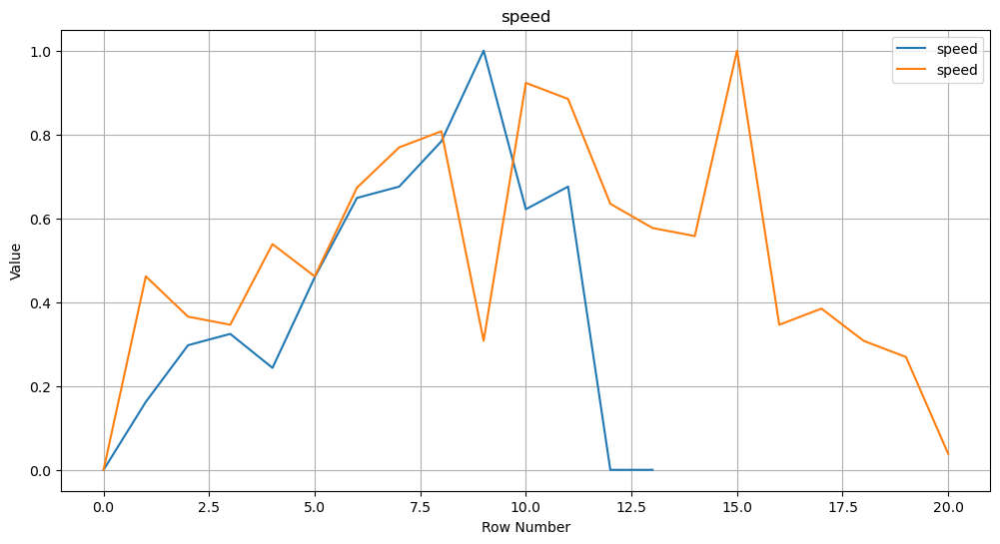

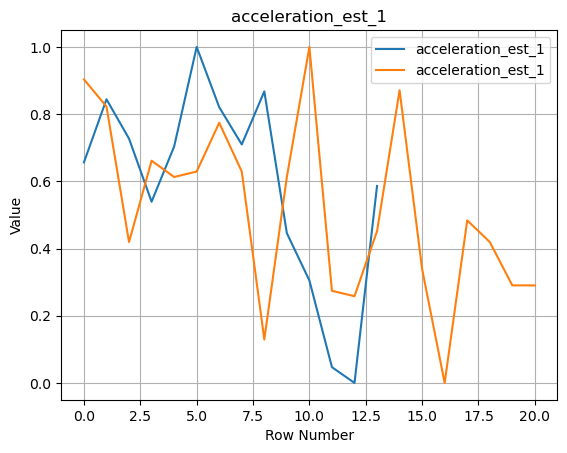

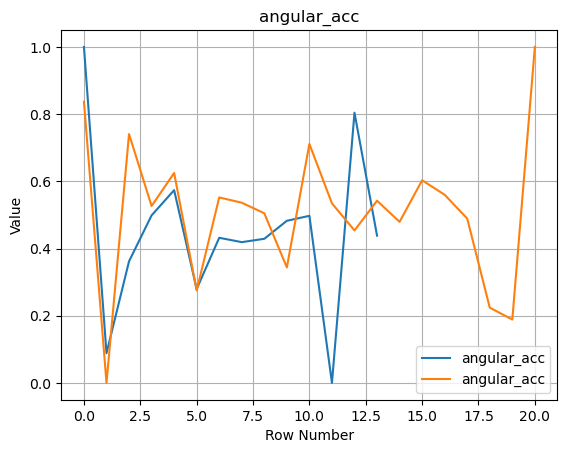

In [23]:
series1 = splitted_ts_groups[1][2]
series2 = splitted_ts_groups[2][8]
def min_max(df):
    # Select the columns to scale
    columns_to_scale = ['speed','acceleration_est_1','angular_acc']

    # Initialize MinMaxScaler
    scaler = MinMaxScaler()

    # Fit and transform the selected columns
    df[columns_to_scale] = scaler.fit_transform(df[columns_to_scale])
    return df
series1 = min_max(series1)
series2 = min_max(series2)
plot_multi_dimensional_time_series([series1,series2])

In [28]:
trip_on_map(series1)

In [29]:

trip_on_map(series2)

In [39]:
# upload_coor_data(series2)

FileNotFoundError: [Errno 2] No such file or directory: '/bigdata/users-home/dor/transpotation research/agg_data/coors_data_ts_new/349.0/start/start_(34.85187, 32.17338)'

In [185]:
import numpy as np
import pandas as pd
from sklearn.linear_model import RidgeClassifierCV
from sklearn.metrics import accuracy_score
from sktime.transformations.panel.rocket import Rocket
from sktime.datasets import load_basic_motions

# Load dataset
X_train, y_train = load_basic_motions(split="train", return_X_y=True)
X_test, y_test = load_basic_motions(split="test", return_X_y=True)

# Initialize ROCKET
rocket = Rocket()

# Fit ROCKET on training data
rocket.fit(X_train)

# Transform the training and test data
X_train_transform = rocket.transform(X_train)
X_test_transform = rocket.transform(X_test)

# Train a classifier on the transformed data
classifier = RidgeClassifierCV(alphas=np.logspace(-3, 3, 10))
classifier.fit(X_train_transform, y_train)

# Predict and evaluate on the test data
y_pred = classifier.predict(X_test_transform)
accuracy = accuracy_score(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')


Accuracy: 0.97


In [32]:
y_train

array(['standing', 'standing', 'standing', 'standing', 'standing',
       'standing', 'standing', 'standing', 'standing', 'standing',
       'running', 'running', 'running', 'running', 'running', 'running',
       'running', 'running', 'running', 'running', 'walking', 'walking',
       'walking', 'walking', 'walking', 'walking', 'walking', 'walking',
       'walking', 'walking', 'badminton', 'badminton', 'badminton',
       'badminton', 'badminton', 'badminton', 'badminton', 'badminton',
       'badminton', 'badminton'], dtype='<U9')

In [188]:
X_train.dtypes

dim_0    object
dim_1    object
dim_2    object
dim_3    object
dim_4    object
dim_5    object
dtype: object

In [29]:
import numpy as np
import pandas as pd
from sklearn.cluster import DBSCAN
from fastdtw import fastdtw
from scipy.spatial.distance import euclidean

def calculate_dtw(series1, series2):
    distance, _ = fastdtw(series1, series2, dist=euclidean)
    return distance
def ensure_same_features(time_series_list):
    common_features = set.intersection(*[set(ts.columns) for ts in time_series_list])
    aligned_time_series = [ts[common_features] for ts in time_series_list]
    return aligned_time_series

# def calculate_distance_matrix(time_series_array):
#     n = len(time_series_array)
#     distance_matrix = np.zeros((n, n))
    
#     for i in range(n):
#         for j in range(i + 1, n):
#             # Extracting the feature matrices
#             series_i = time_series_array[i]
#             series_j = time_series_array[j]
            
#             # Calculating the DTW distance
        
# #             if series_i.columns == series_j.columns:
          
#             distance = calculate_dtw(series_i, series_j)
          
                
#             distance_matrix[i, j] = distance
#             distance_matrix[j, i] = distance
    
#     return distance_matrix







def cluster_time_series(time_series_array, eps=0.5, min_samples=20):
    # Calculate the distance matrix using FastDTW
    time_series_array = ensure_same_features(time_series_array)
#     distance_matrix = calculate_distance_matrix(time_series_array)
    # Example: Compute distances between all pairs of time series
    num_series = len(time_series_array)
    distance_matrix = np.zeros((num_series, num_series))
    for i in range(num_series):
        for j in range(i + 1, num_series):
            distance_matrix[i, j] = calculate_dtw(time_series_array[i], time_series_array[j])
            distance_matrix[j, i] = distance_matrix[i, j]
    
    # Apply DBSCAN with the precomputed distance matrix
    db = DBSCAN(eps=eps, min_samples=min_samples, metric='precomputed')
    db.fit(distance_matrix)

    # Get cluster labels
    cluster_labels = db.labels_
    return cluster_labels




In [30]:
cluster_time_series(time_series_array=group_ts_for_dbscan[1]+group_ts_for_dbscan[2]+group_ts_for_dbscan[3]+group_ts_for_dbscan[4])

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

NameError: name 'distance_matrix' is not defined

In [23]:
group_ts_for_dbscan[1]

[         speed  road_speed  acceleration_est_1  angular_acc  hour
 0     0.300226        50.0                0.00         0.00     6
 1     0.323497        50.0                0.00         0.00     6
 2     0.700528        50.0                0.00         0.00     6
 3     0.217341        50.0                0.00         0.00     6
 4     0.689471        50.0                0.00         0.00     6
 ..         ...         ...                 ...          ...   ...
 120  27.687888        50.0               -0.55         2.83     6
 121  17.622705        50.0               -1.20        -5.55     6
 122   8.536877        50.0               -0.80         2.81     6
 123   3.757247        50.0               -0.05        -0.30     6
 124   2.138777        50.0                0.15         0.26     6
 
 [125 rows x 5 columns],
          speed  road_speed  acceleration_est_1  angular_acc  hour
 0     0.667170        50.0                0.00         0.00     5
 1     0.652023        50.0        